In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

# uncomment to disable numba
# os.environ['NOJIT'] = 'true'

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import json
import pprint
from njit_multisymbol import *
from procedures import utc_ms, load_live_config, fetch_market_specific_settings, make_get_filepath
from pure_funcs import (
    date_to_ts2,
    ts_to_date_utc,
    tuplify,
    numpyize,
    stats_multi_to_df,
    fills_multi_to_df,
    calc_drawdowns,
    calc_sharpe_ratio,
    analyze_fills_multi,
    live_config_dict_to_list_recursive_grid,
)
from njit_funcs import round_dynamic
from plotting import plot_fills_multi, plot_pnls_long_short, plot_pnls_separate, plot_pnls_stuck
from numba import njit
from downloader import load_hlc_cache, prepare_multsymbol_data

using numba
using numba
using numba


In [3]:
plt.rcParams["figure.figsize"] = [24, 13.5]
plt.rcParams["figure.facecolor"] = "w"
pd.set_option("display.precision", 10)

### multi symbol backtest with lossless auto unstuck

- if a position is stuck, bot will use profits made on other markets to realize losses for the stuck position
- if multiple positions are stuck, select the stuck pos whose price action distance is the lowest
- each live config's individual auto unstuck is disabled

In [4]:
# select symbols for multi symbol backtest
symbols = ['BANDUSDT', 'CELRUSDT', 'CHRUSDT', 'GRTUSDT', 'HBARUSDT', 'HOTUSDT',
           'KSMUSDT', 'LITUSDT', 'MKRUSDT', 'NKNUSDT', 'OCEANUSDT', 'OMGUSDT',
           'REEFUSDT', 'RLCUSDT', 'RSRUSDT', 'SFPUSDT', 'SNXUSDT', 'STMXUSDT',
           'THETAUSDT']
print(symbols, len(symbols))
long_enabled = True
short_enabled = True
symbols = tuple(symbols)
lcs = [
    load_live_config(f"configs/live/multisymbol/no_AU/{symbol}.json") for symbol in symbols
]  # each symbol may have its own config

TWE_long = 3.0  # WE_limit for each symbol will be TWE / len(symbols)
TWE_short = 2.0  # WE_limit for each symbol will be TWE / len(symbols)

loss_allowance_pct = 0.01  # pct below peak balance to allow losses
stuck_threshold = 0.95  # if WE / WE_limit > unstuck_threshold: consider position as stuck
unstuck_close_pct = 0.01  # max pct of balance * WE_limit to close on each unstuck order

for i in range(len(lcs)):
    lcs[i]["long"]["wallet_exposure_limit"] = TWE_long / len(symbols)
    lcs[i]["short"]["wallet_exposure_limit"] = TWE_short / len(symbols)

# convert configs to numpy matrix
live_configs = numpyize([live_config_dict_to_list_recursive_grid(lc) for lc in lcs])

['BANDUSDT', 'CELRUSDT', 'CHRUSDT', 'GRTUSDT', 'HBARUSDT', 'HOTUSDT', 'KSMUSDT', 'LITUSDT', 'MKRUSDT', 'NKNUSDT', 'OCEANUSDT', 'OMGUSDT', 'REEFUSDT', 'RLCUSDT', 'RSRUSDT', 'SFPUSDT', 'SNXUSDT', 'STMXUSDT', 'THETAUSDT'] 19


In [5]:
start_date = "2021-05-01"
end_date = "now"
if end_date in ["now", "", "today"]:
    end_date = ts_to_date_utc(utc_ms())[:10]
coins = [s.replace("USDT", "") for s in symbols]
cache_fname = make_get_filepath(f"tmp/cache/{'_'.join(coins)}_{start_date}_{end_date}_hlc_cache.npy")
print("cache filename", cache_fname)
# prepare_multsymbol_data() is computationally expensive, so use a cache
try:
    hlcs = np.load(cache_fname)
    first_ts = 0
except:
    first_ts, hlcs = await prepare_multsymbol_data(symbols, start_date, end_date)
    np.save(cache_fname, hlcs)

cache filename tmp/cache/BAND_CELR_CHR_GRT_HBAR_HOT_KSM_LIT_MKR_NKN_OCEAN_OMG_REEF_RLC_RSR_SFP_SNX_STMX_THETA_2021-05-01_2024-01-09_hlc_cache.npy
first ohlcv at 2020-07-01T02:00:00
fetching https://data.binance.vision/data/futures/um/daily/klines/BANDUSDT/1m/BANDUSDT-1m-2024-01-08.zip
BANDUSDT most n days of consecutive identical ohlcvs: 1.000, index last: 583199
first ohlcv at 2021-03-01T01:00:00
fetching https://data.binance.vision/data/futures/um/daily/klines/CELRUSDT/1m/CELRUSDT-1m-2024-01-08.zip
CELRUSDT most n days of consecutive identical ohlcvs: 0.024, index last: 565514
first ohlcv at 2021-03-01T01:00:00
fetching https://data.binance.vision/data/futures/um/daily/klines/CHRUSDT/1m/CHRUSDT-1m-2024-01-08.zip
CHRUSDT most n days of consecutive identical ohlcvs: 0.024, index last: 565514
first ohlcv at 2020-12-01T01:00:00
fetching https://data.binance.vision/data/futures/um/daily/klines/GRTUSDT/1m/GRTUSDT-1m-2024-01-08.zip
GRTUSDT most n days of consecutive identical ohlcvs: 3.000,

In [6]:
starting_balance = 1000000.0
do_longs = tuplify([long_enabled for _ in range(len(symbols))])
do_shorts = tuplify([short_enabled for _ in range(len(symbols))])

cache_fname_mss = make_get_filepath("tmp/" + "_".join(symbols) + "_market_specific_settings.json")

mss = []
for symbol in symbols:
    cache_fname_mss = make_get_filepath(f"tmp/market_specific_settings/{symbol}.json")
    try:
        mss.append(json.load(open(cache_fname_mss)))
    except:
        print("fetching market specific settings for", symbol)
        mss_ = fetch_market_specific_settings(
            {"symbol": symbol, "exchange": "binance", "market_type": "futures"}
        )
        json.dump(mss_, open(cache_fname_mss, "w"))
        mss.append(mss_)

maker_fee = mss[0]["maker_fee"]

qty_steps = tuplify([mss[i]["qty_step"] for i in range(len(symbols))])
price_steps = tuplify([mss[i]["price_step"] for i in range(len(symbols))])
min_costs = tuplify([mss[i]["min_cost"] for i in range(len(symbols))])
min_qtys = tuplify([mss[i]["min_qty"] for i in range(len(symbols))])
c_mults = tuplify([mss[i]["c_mult"] for i in range(len(symbols))])

fetching market specific settings for BANDUSDT
fetching market specific settings for CELRUSDT
fetching market specific settings for CHRUSDT
fetching market specific settings for GRTUSDT
fetching market specific settings for HBARUSDT
fetching market specific settings for HOTUSDT
fetching market specific settings for KSMUSDT
fetching market specific settings for LITUSDT
fetching market specific settings for MKRUSDT
fetching market specific settings for NKNUSDT
fetching market specific settings for OCEANUSDT
fetching market specific settings for OMGUSDT
fetching market specific settings for REEFUSDT
fetching market specific settings for RLCUSDT
fetching market specific settings for RSRUSDT
fetching market specific settings for SFPUSDT
fetching market specific settings for SNXUSDT
fetching market specific settings for STMXUSDT
fetching market specific settings for THETAUSDT


In [7]:
hlcs_clipped = hlcs  # [:,0:60000] # to backtest on subset on data

In [8]:
# will compile JIT on the first run, then be faster on subsequent runs
sts = utc_ms()
res = backtest_multisymbol_recursive_grid(
    hlcs_clipped,
    starting_balance,
    maker_fee,
    do_longs,
    do_shorts,
    c_mults,
    symbols,
    qty_steps,
    price_steps,
    min_costs,
    min_qtys,
    live_configs,
    loss_allowance_pct,
    stuck_threshold,
    unstuck_close_pct,
)
print(f"time elapsed for backtest {(utc_ms() - sts) / 1000:.6f}s")
fills, stats = res

time elapsed for backtest 95.151896s


In [9]:
sts = utc_ms()
fdf = fills_multi_to_df(fills, symbols, c_mults)
sdf = stats_multi_to_df(stats, symbols, c_mults)
print(f"time elapsed for analysis {(utc_ms() - sts) / 1000:.6f}s")

time elapsed for analysis 12.938745s


In [10]:
params = {"TWE_long": TWE_long, "TWE_short": TWE_short}
analysis = analyze_fills_multi(sdf, fdf, params)

In [11]:
mkl = max([len(k) for k in analysis])
for k, v in analysis.items():
    if isinstance(v, dict):
        continue
        mkls = max([len(s) for s in v])
        for symbol in v:
            mkl1 = max([len(k) for k in v[symbol]])
            for k1, v1 in v[symbol].items():
                print(f"    {symbol: <{mkls}} {k1: <{mkl1}} {round_dynamic(v1, 6)}")
            print()
    else:
        print(f"{k: <{mkl}} {round_dynamic(v, 6)}")
adf = pd.DataFrame({k: v for k, v in analysis["individual_analyses"].items()})
adf

n_days                     983.0
starting_balance           1000000.0
final_balance              513613000.0
final_equity               508068000.0
drawdown_max               0.500705
mean_of_10_worst_drawdowns 0.212107
adg                        0.00659067
adg_weighted               0.00479276
adg_long                   0.00610125
adg_weighted_long          0.00488194
adg_short                  0.00531364
adg_weighted_short         0.00429597
pnl_sum                    532218000.0
pnl_long                   360273000.0
pnl_short                  171945000.0
pnl_ratio_long_short       0.676927
sum_profit_long            372360000.0
sum_profit_short           250025000.0
sum_loss_long              -12086500.0
sum_loss_short             -78080000.0
loss_profit_ratio_long     0.0324593
loss_profit_ratio_short    0.312289
stuck_time_ratio_long      0.215276
stuck_time_ratio_short     0.437164
stuck_time_ratio_any       0.597169
eqbal_ratio_mean           0.983521
eqbal_ratio_min           

,BANDUSDT,CELRUSDT,CHRUSDT,GRTUSDT,HBARUSDT,HOTUSDT,KSMUSDT,LITUSDT,MKRUSDT,NKNUSDT,OCEANUSDT,OMGUSDT,REEFUSDT,RLCUSDT,RSRUSDT,SFPUSDT,SNXUSDT,STMXUSDT,THETAUSDT
pnl_ratio,3.0806505895e-02,7.2091852291e-02,4.3945105632e-02,5.0974672355e-02,4.0737266299e-02,6.4183275264e-02,5.5065396783e-03,7.0620515030e-02,5.3863190488e-02,5.8424550901e-02,6.7863819199e-02,3.8828023984e-02,6.5847844686e-02,5.4263322520e-02,5.2223957561e-02,4.5395867574e-02,6.4876063996e-02,7.7176185199e-02,4.2371441447e-02
pnl_ratio_long_short,8.6320095765e-01,5.6054160924e-01,5.0166465997e-01,8.1707934946e-01,9.3676908836e-01,6.4405675900e-01,5.0976533107e+00,4.5775504617e-01,7.6057724163e-01,7.5995560668e-01,5.8783499706e-01,5.7010286604e-01,5.3712989121e-01,7.3549295343e-01,7.5544774840e-01,5.9714874321e-01,7.9905216527e-01,4.1544469944e-01,7.8342367665e-01
pnl_long,1.4152854680e+07,2.1507192938e+07,1.1733125383e+07,2.2167073861e+07,2.0310196460e+07,2.2000659952e+07,1.4939592783e+07,1.7204961772e+07,2.1803443636e+07,2.3630521006e+07,2.1231634357e+07,1.1781164076e+07,1.8823942030e+07,2.1240981909e+07,2.0997321688e+07,1.4427415321e+07,2.7589848592e+07,1.7064211328e+07,1.7666870362e+07
pnl_short,2.2429272693e+06,1.6861400193e+07,1.1655257972e+07,4.9625725751e+06,1.3709165403e+06,1.2158844850e+07,-1.2008912356e+07,2.0380558947e+07,6.8635246124e+06,7.4640860981e+06,1.4886722773e+07,8.8838154882e+06,1.6221476849e+07,7.6389438741e+06,6.7972170243e+06,9.7330898881e+06,6.9383709552e+06,2.4010356120e+07,4.8839803318e+06
sum_profit_long,1.4642540904e+07,2.1567296349e+07,1.2029123356e+07,2.2305283280e+07,2.0390930005e+07,2.2058741578e+07,1.5380612727e+07,1.7249576869e+07,2.2026185645e+07,2.3721254673e+07,2.4014160421e+07,1.1872992236e+07,1.9115753851e+07,2.6002442680e+07,2.1012479729e+07,1.6069041664e+07,2.7647971625e+07,1.7338003907e+07,1.7915153282e+07
sum_loss_long,-4.8968622390e+05,-6.0103410510e+04,-2.9599797360e+05,-1.3820941893e+05,-8.0733544952e+04,-5.8081626373e+04,-4.4101994438e+05,-4.4615097191e+04,-2.2274200881e+05,-9.0733666618e+04,-2.7825260640e+06,-9.1828159864e+04,-2.9181182058e+05,-4.7614607710e+06,-1.5158040870e+04,-1.6416263426e+06,-5.8123033163e+04,-2.7379257876e+05,-2.4828291956e+05
loss_profit_ratio_long,3.3442708278e-02,2.7867846548e-03,2.4606778468e-02,6.1962637819e-03,3.9592870425e-03,2.6330435110e-03,2.8673756514e-02,2.5864458896e-03,1.0112600175e-02,3.8249944140e-03,1.1587022054e-01,7.7342053324e-03,1.5265514656e-02,1.8311590298e-01,7.2138277182e-04,1.0216081189e-01,2.1022530677e-03,1.5791470589e-02,1.3858821951e-02
sum_profit_short,8.3444738269e+06,2.2069033251e+07,1.2627335058e+07,1.6022593997e+07,9.8673076338e+06,1.2228920965e+07,8.1412266891e+06,2.0629938090e+07,7.4127322849e+06,7.5014188898e+06,1.5424191965e+07,1.2431117721e+07,1.8884402059e+07,8.2990623155e+06,1.2445957839e+07,1.6507132638e+07,8.7013955754e+06,2.7510277675e+07,4.9766292967e+06
sum_loss_short,-6.1015465576e+06,-5.2076330579e+06,-9.7207708598e+05,-1.1060021422e+07,-8.4963910935e+06,-7.0076115338e+04,-2.0150139045e+07,-2.4937914255e+05,-5.4920767249e+05,-3.7332791781e+04,-5.3746919172e+05,-3.5473022330e+06,-2.6629252099e+06,-6.6011844143e+05,-5.6487408145e+06,-6.7740427498e+06,-1.7630246202e+06,-3.4999215551e+06,-9.2648964881e+04
loss_profit_ratio_short,7.3120806466e-01,2.3597014870e-01,7.6981966624e-02,6.9027658218e-01,8.6106478168e-01,5.7303596561e-03,2.4750740661e+00,1.2088215751e-02,7.4089775725e-02,4.9767640401e-03,3.4845857271e-02,2.8535666000e-01,1.4101188915e-01,7.9541328445e-02,4.5386147757e-01,4.1037064997e-01,2.0261400656e-01,1.2722232747e-01,1.8616810568e-02


In [12]:
if not adf.T.upnl_pct_min_long.isna().all():
    print("upnl pct min long")
    print(adf.T.upnl_pct_min_long.sort_values())
    print()
if not adf.T.upnl_pct_min_short.isna().all():
    print("upnl pct min short")
    print(adf.T.upnl_pct_min_short.sort_values())

upnl pct min long
NKNUSDT     -0.1071873163
GRTUSDT     -0.0857738695
KSMUSDT     -0.0736585206
HOTUSDT     -0.0724025282
LITUSDT     -0.0570724767
SNXUSDT     -0.0568875423
HBARUSDT    -0.0567919301
SFPUSDT     -0.0556852778
OCEANUSDT   -0.0555733669
RSRUSDT     -0.0555313440
RLCUSDT     -0.0519319739
REEFUSDT    -0.0456844929
STMXUSDT    -0.0441959046
BANDUSDT    -0.0375827038
THETAUSDT   -0.0338577655
MKRUSDT     -0.0329512109
CELRUSDT    -0.0286376642
OMGUSDT     -0.0273638898
CHRUSDT     -0.0201614533
Name: upnl_pct_min_long, dtype: float64

upnl pct min short
RLCUSDT     -0.1812472390
SFPUSDT     -0.1701403114
BANDUSDT    -0.1301257787
CHRUSDT     -0.1011548355
GRTUSDT     -0.0923843697
SNXUSDT     -0.0695715410
OCEANUSDT   -0.0584036699
HOTUSDT     -0.0551700261
REEFUSDT    -0.0503120312
LITUSDT     -0.0433022569
STMXUSDT    -0.0399163555
RSRUSDT     -0.0375866211
OMGUSDT     -0.0334923261
NKNUSDT     -0.0317388353
MKRUSDT     -0.0304307537
THETAUSDT   -0.0296741593
CELRUSDT    

In [13]:
if not (adf.T.loss_profit_ratio_long == 1.0).all():
    print("loss_profit_ratio_long")
    print(adf.T.loss_profit_ratio_long.sort_values(ascending=False))
    print()
if not (adf.T.loss_profit_ratio_short == 1.0).all():
    print("loss_profit_ratio_short")
    print(adf.T.loss_profit_ratio_short.sort_values(ascending=False))

loss_profit_ratio_long
SFPUSDT      0.2600282948
RLCUSDT      0.2004275888
GRTUSDT      0.1350604881
OCEANUSDT    0.1274487580
HOTUSDT      0.0868524738
BANDUSDT     0.0279398380
STMXUSDT     0.0227911439
CELRUSDT     0.0180277126
OMGUSDT      0.0172686271
KSMUSDT      0.0170003582
REEFUSDT     0.0112814923
NKNUSDT      0.0111183820
HBARUSDT     0.0102006041
THETAUSDT    0.0058523715
CHRUSDT      0.0041881856
LITUSDT      0.0032698672
SNXUSDT      0.0026374249
MKRUSDT      0.0022434620
RSRUSDT      0.0017414481
Name: loss_profit_ratio_long, dtype: float64

loss_profit_ratio_short
GRTUSDT      0.8629381226
KSMUSDT      0.6325406942
BANDUSDT     0.5384897726
OMGUSDT      0.4392827716
RSRUSDT      0.3535301253
STMXUSDT     0.3472706825
MKRUSDT      0.3402322294
RLCUSDT      0.3288602699
OCEANUSDT    0.2635492511
CELRUSDT     0.1683267817
SFPUSDT      0.1172575324
CHRUSDT      0.1039835718
REEFUSDT     0.0711626442
SNXUSDT      0.0329619961
HBARUSDT     0.0297860864
NKNUSDT      0.01439642

In [14]:
adf.T.pnl_ratio.sort_values()

BANDUSDT     0.0328372088
KSMUSDT      0.0348369379
CHRUSDT      0.0357880434
RSRUSDT      0.0393306121
OMGUSDT      0.0431050481
REEFUSDT     0.0492940219
HBARUSDT     0.0516300849
STMXUSDT     0.0516356975
THETAUSDT    0.0525403179
RLCUSDT      0.0527994020
LITUSDT      0.0566187924
SFPUSDT      0.0566741951
HOTUSDT      0.0570275555
MKRUSDT      0.0577860403
NKNUSDT      0.0580991116
OCEANUSDT    0.0582617474
CELRUSDT     0.0594106923
SNXUSDT      0.0671539204
GRTUSDT      0.0851705704
Name: pnl_ratio, dtype: float64

In [15]:
# symbols with worst individual drawdowns and worst pnls
len_adf = len(adf.T)
drawdown_worst = adf.T.upnl_pct_min_long.sort_values().iloc[:int(len_adf * 0.5)]
pnl_worst = adf.T.pnl_ratio.sort_values().iloc[:int(len_adf * 0.5)]
set(dict(drawdown_worst)) & set(dict(pnl_worst))

{'HBARUSDT', 'KSMUSDT'}

In [16]:
sdf

,balance,equity,BANDUSDT_psize_l,BANDUSDT_pprice_l,BANDUSDT_psize_s,BANDUSDT_pprice_s,BANDUSDT_price,BANDUSDT_upnl_pct_l,BANDUSDT_upnl_pct_s,CELRUSDT_psize_l,...,RSRUSDT_WE_l,RSRUSDT_WE_s,SFPUSDT_WE_l,SFPUSDT_WE_s,SNXUSDT_WE_l,SNXUSDT_WE_s,STMXUSDT_WE_l,STMXUSDT_WE_s,THETAUSDT_WE_l,THETAUSDT_WE_s
minute,,,,,,,,,,,,,,,,,,,,,
0,1.0000000000e+06,1.0000000000e+06,NaN,NaN,NaN,NaN,17.2084,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60,1.0002837496e+06,9.9978714511e+05,9.5200000000e+01,17.2677000000,NaN,NaN,17.0382,-0.0000218422,NaN,NaN,...,NaN,0.0018433031,NaN,0.0014300286,0.0021221849,0.0010747079,0.0049561876,NaN,0.0024752243,0.0014147350
120,1.0006408798e+06,1.0001000567e+06,9.5200000000e+01,17.2677000000,-1.0000000000e+02,17.2303000000,17.2912,0.0000022358,-0.0000060861,NaN,...,NaN,0.0018426452,NaN,0.0014293280,NaN,0.0010743243,0.0066063691,NaN,0.0024743408,0.0014142301
180,1.0007105377e+06,9.9928008833e+05,9.4400000000e+01,17.4215000000,-1.0000000000e+02,17.2303000000,17.4736,0.0000049147,-0.0000243127,NaN,...,NaN,0.0018425170,NaN,0.0033949398,NaN,0.0010742495,0.0066059093,NaN,0.0024748919,0.0039039528
240,1.0007617307e+06,9.9933206997e+05,9.4400000000e+01,17.4215000000,-1.0000000000e+02,17.2303000000,17.5435,0.0000115080,-0.0000312962,NaN,...,NaN,0.0018424227,NaN,0.0033947661,NaN,0.0010741946,0.0066055714,NaN,0.0024748238,0.0039037531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379280,5.1533191425e+08,4.9604048738e+08,9.2623960000e+05,1.8292265756,-4.0065654100e+07,1.3537501543,1.7876,-0.0000748182,-0.0337306450,75415036.0,...,NaN,0.0018428317,NaN,0.0033885344,NaN,0.0010742119,NaN,0.0029083456,0.0024741548,0.0014141394
1379340,5.1534059886e+08,4.9485540890e+08,9.2623960000e+05,1.8292265756,-4.0065654100e+07,1.3537501543,1.7724,-0.0001021364,-0.0325483378,75415036.0,...,NaN,0.0018428006,NaN,0.0033884773,0.0021222490,0.0010741938,NaN,0.0029082966,0.0024741131,0.0014141156
1379400,5.1542121413e+08,4.8861551064e+08,9.2623960000e+05,1.8292265756,-4.0065654100e+07,1.3537501543,1.7665,-0.0001127230,-0.0320846176,NaN,...,NaN,0.0018425124,NaN,0.0033879473,NaN,0.0010740258,NaN,0.0029078417,0.0024737261,0.0014138944


In [17]:
fdf

,symbol,pnl,fee_paid,balance,equity,qty,price,psize,pprice,type,stuckness,cost,WE,upnl_pct
minute,,,,,,,,,,,,,,
2,CHRUSDT,0.00000,-0.349134320,9.9999965087e+05,9.9999965087e+05,4916.0,0.35510,4.9160000000e+03,0.3551000000,long_ientry_normal,0.0110559240,1.7456716000e+03,0.0017456722,0.0000000000
2,GRTUSDT,0.00000,-0.325118304,9.9999932575e+05,1.0000017837e+06,1044.0,1.55708,1.0440000000e+03,1.5570800000,long_ientry_normal,0.0102954199,1.6255915200e+03,0.0016255926,0.0000000000
2,NKNUSDT,0.00000,-0.809733640,9.9999851601e+05,1.0000095035e+06,5890.0,0.68738,5.8900000000e+03,0.6873800000,long_ientry_normal,0.0256416033,4.0486682000e+03,0.0040486742,0.0000000000
2,OCEANUSDT,0.00000,-0.717601956,9.9999779841e+05,1.0000295776e+06,2641.0,1.35858,2.6410000000e+03,1.3585800000,long_ientry_normal,0.0227241120,3.5880097800e+03,0.0035880177,0.0000000000
2,OMGUSDT,0.00000,-0.647291744,9.9999715112e+05,1.0000437991e+06,419.6,7.71320,4.1960000000e+02,7.7132000000,long_ientry_normal,0.0204976303,3.2364587200e+03,0.0032364679,0.0000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379455,STMXUSDT,0.00000,-412.063485768,5.1542794849e+08,5.1542794849e+08,-231236524.0,0.00891,-4.0607607600e+08,0.0087645664,short_rentry,0.0655984357,2.0603174288e+06,0.0069050985,-0.0001145787
1379461,THETAUSDT,0.00000,-256.609241312,5.1542769188e+08,5.1542769188e+08,-1140282.8,1.12520,-1.8060522000e+06,1.1139198478,short_rentry,0.0370800318,1.2830462066e+06,0.0039031612,-0.0000395255
1379492,RLCUSDT,13202.55872,-218.680073568,5.1544067576e+08,4.8904969145e+08,-634738.4,1.72260,0.0000000000e+00,0.0000000000,long_nclose,0.0000000000,1.0934003678e+06,0.0000000000,0.0000000000


minute
25920     -0.4409950752
385920    -0.2689130454
541440    -0.2683906190
383040    -0.2529035943
12960     -0.1842554019
239040    -0.1767584771
31680     -0.1767467978
540000    -0.1701876244
312480    -0.1671550289
1108800   -0.1536100523
Name: equity, dtype: float64


<AxesSubplot:xlabel='minute'>

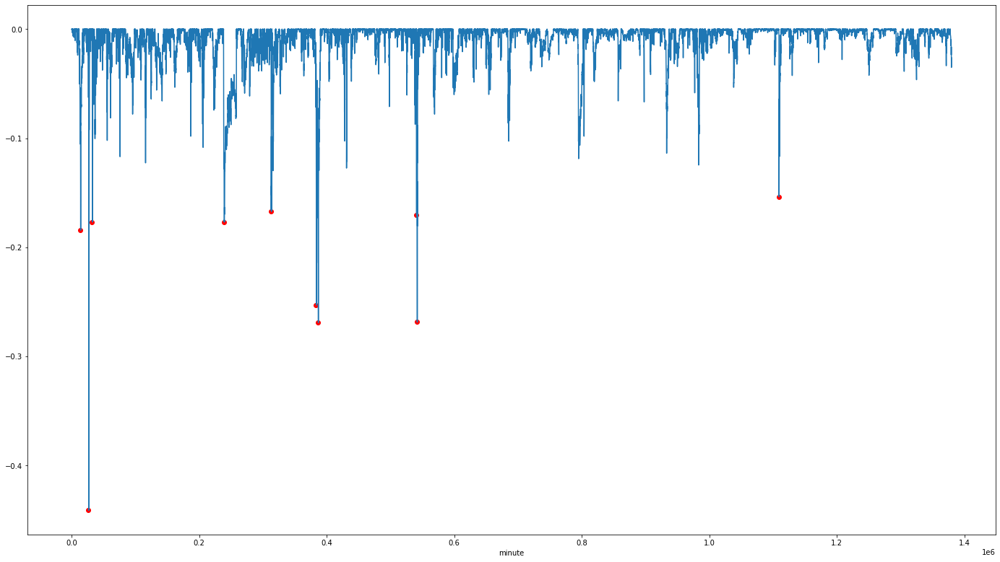

In [18]:
# plot drawdowns
min_multiplier = 60 * 24
drawdowns = calc_drawdowns(sdf.equity)
drawdowns_daily = drawdowns.groupby(drawdowns.index // min_multiplier * min_multiplier).min()
drawdowns_ten_worst = drawdowns_daily.sort_values().iloc[:10]
print(drawdowns_ten_worst)
drawdowns_ten_worst.plot(style="ro")
drawdowns.plot()

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.9/site-packages/matplotlib/pyplot.py'>

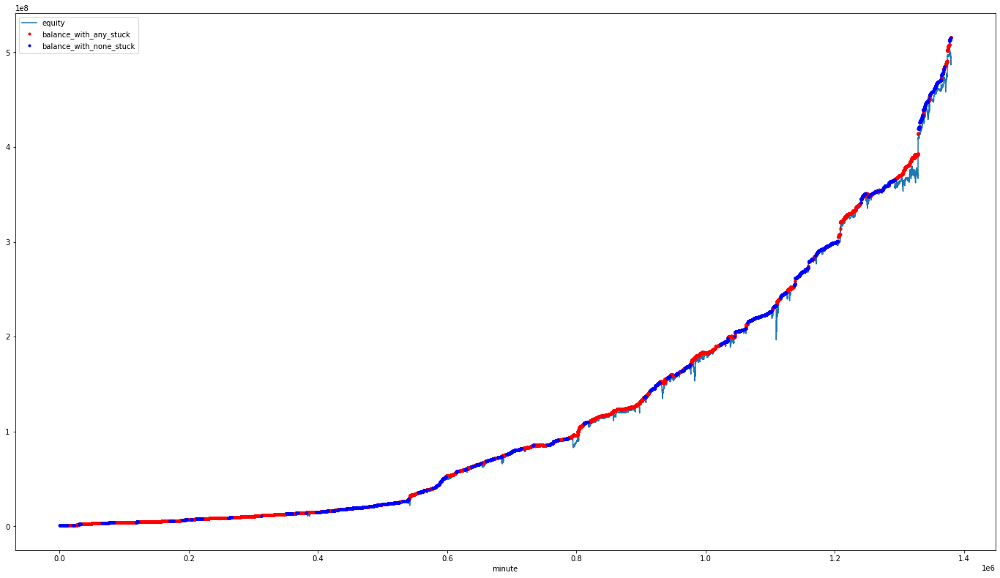

In [19]:
plot_pnls_stuck(sdf, fdf, start_pct=0.0, end_pct=1.0)

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.9/site-packages/matplotlib/pyplot.py'>

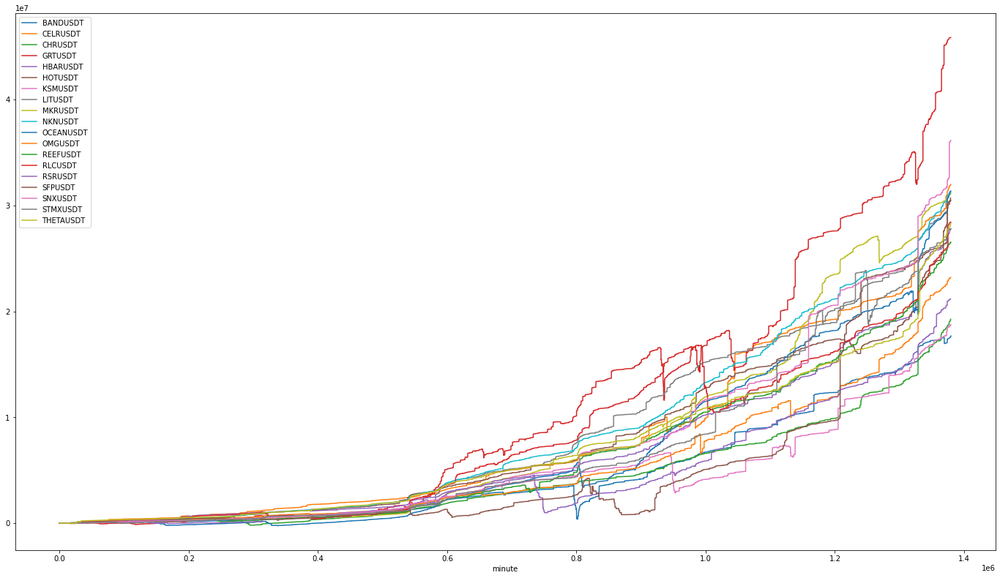

In [20]:
plot_pnls_separate(sdf, fdf)

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.9/site-packages/matplotlib/pyplot.py'>

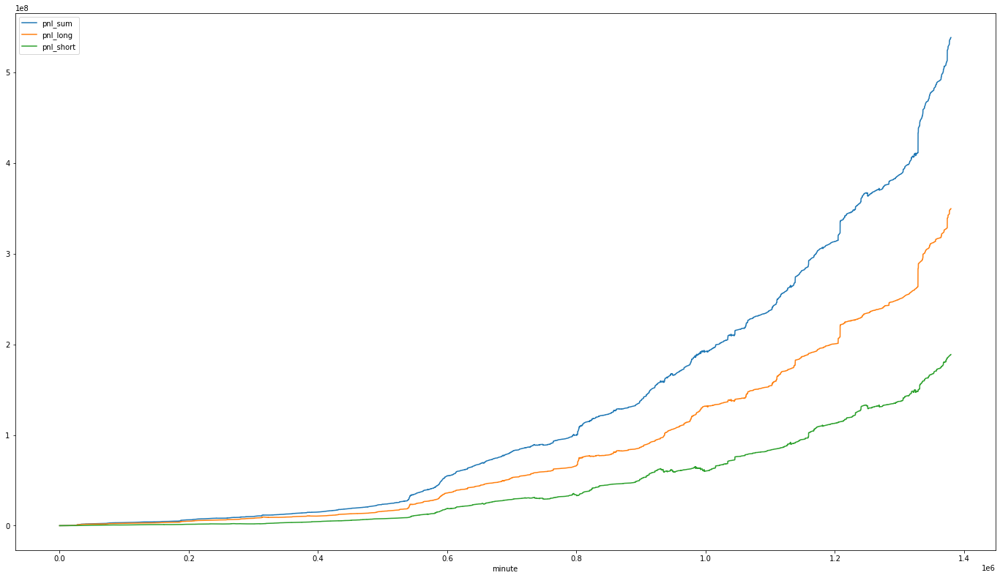

In [21]:
plot_pnls_long_short(sdf, fdf)

<AxesSubplot:xlabel='minute'>

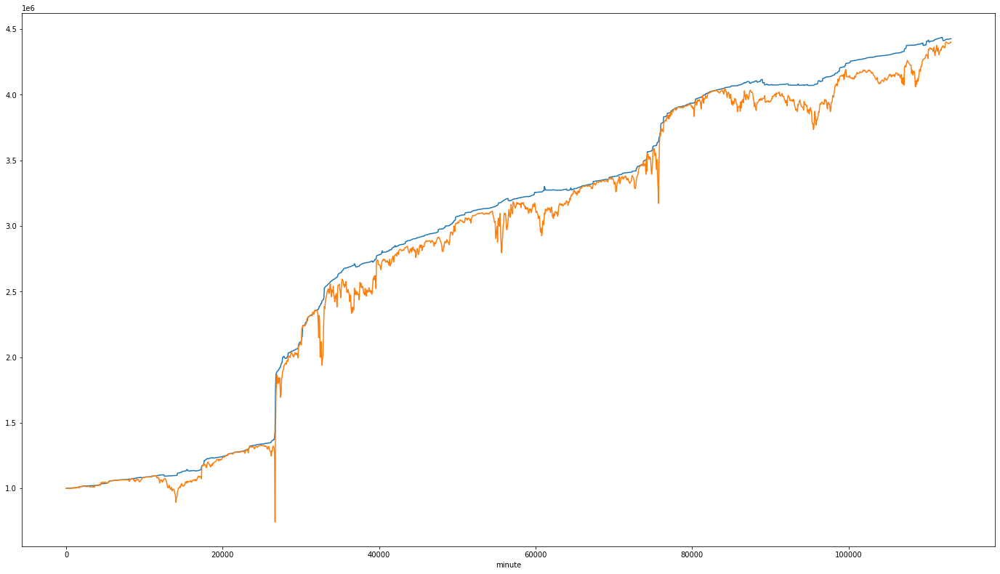

In [22]:
# inspect two months before and two months after location of worst drawdown
drawdowns = calc_drawdowns(sdf.equity)
worst_drawdown_loc = drawdowns.sort_values().iloc[:1].index[0]
wdls = worst_drawdown_loc - 60 * 24 * 30 * 2
wdle = worst_drawdown_loc + 60 * 24 * 30 * 2
sdfc = sdf.loc[wdls:wdle]
sdfc.balance.plot()
sdfc.equity.plot()

BANDUSDT


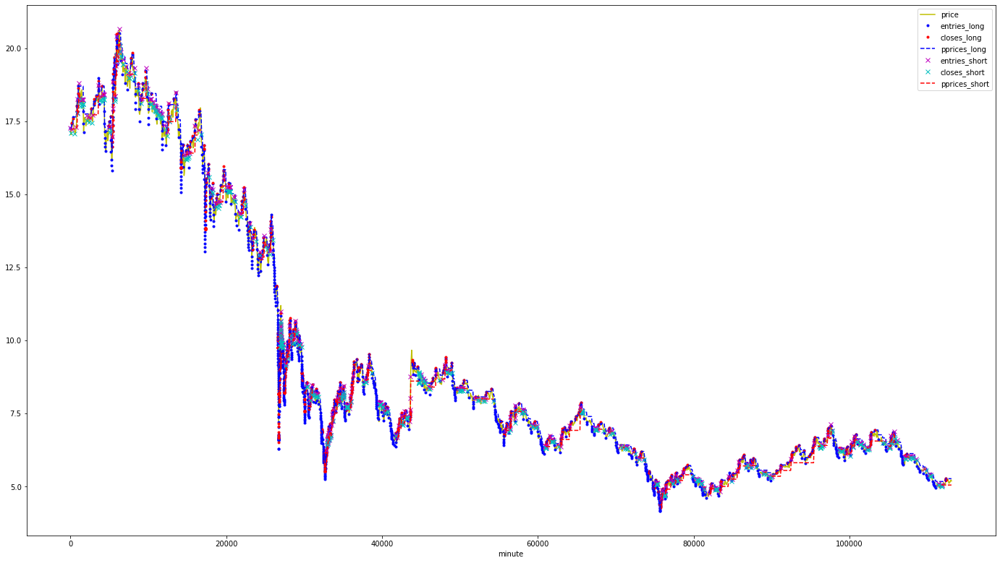

CELRUSDT


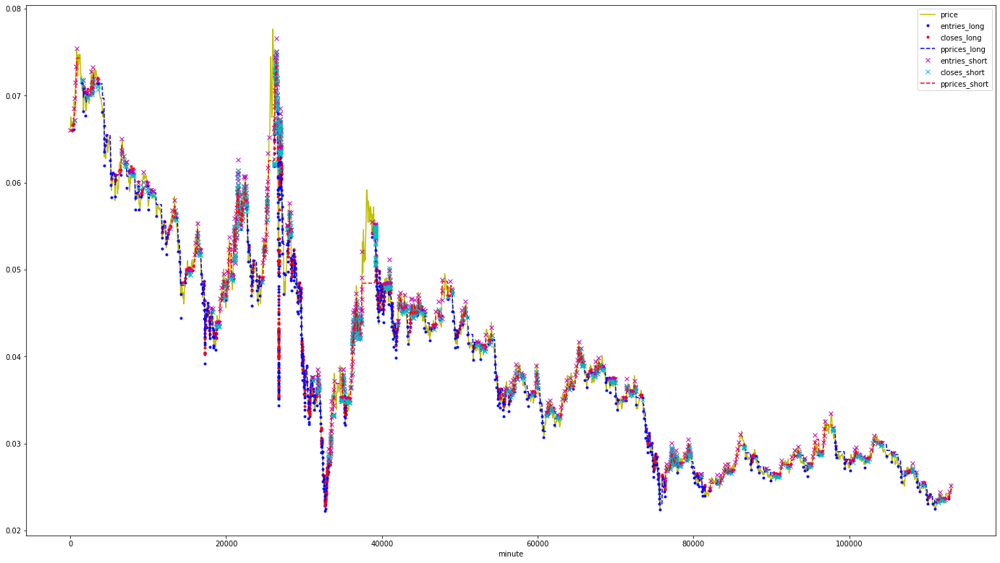

CHRUSDT


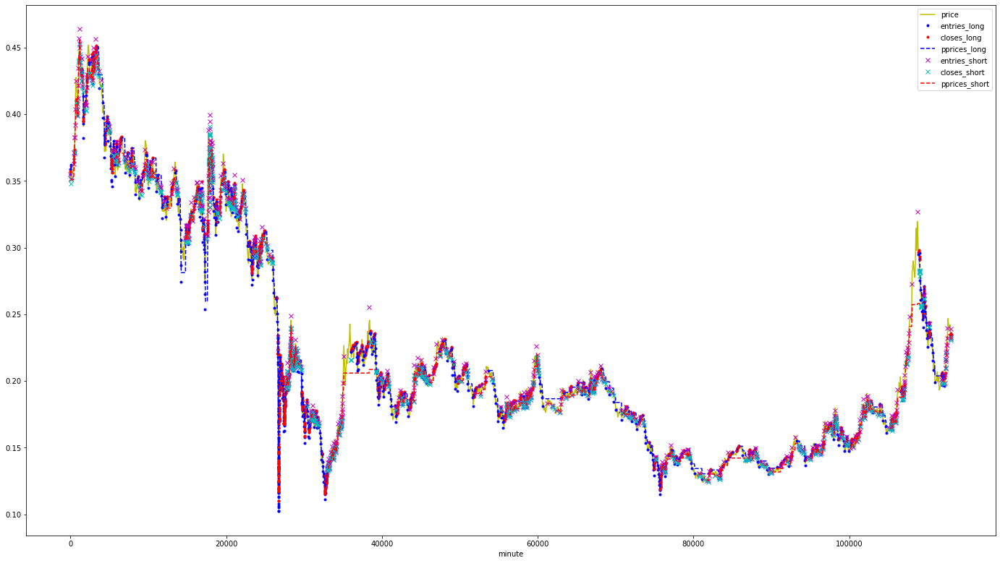

GRTUSDT


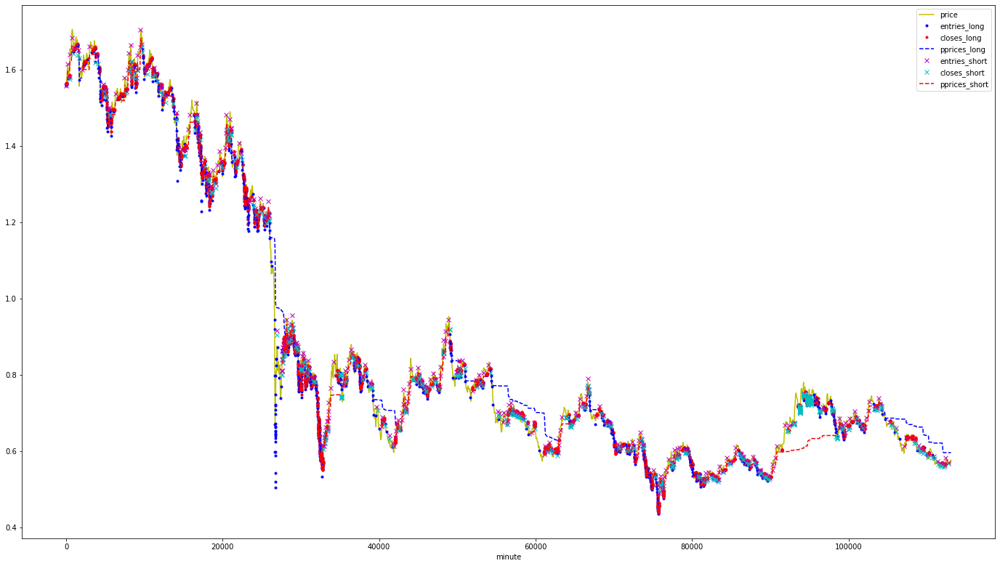

HBARUSDT


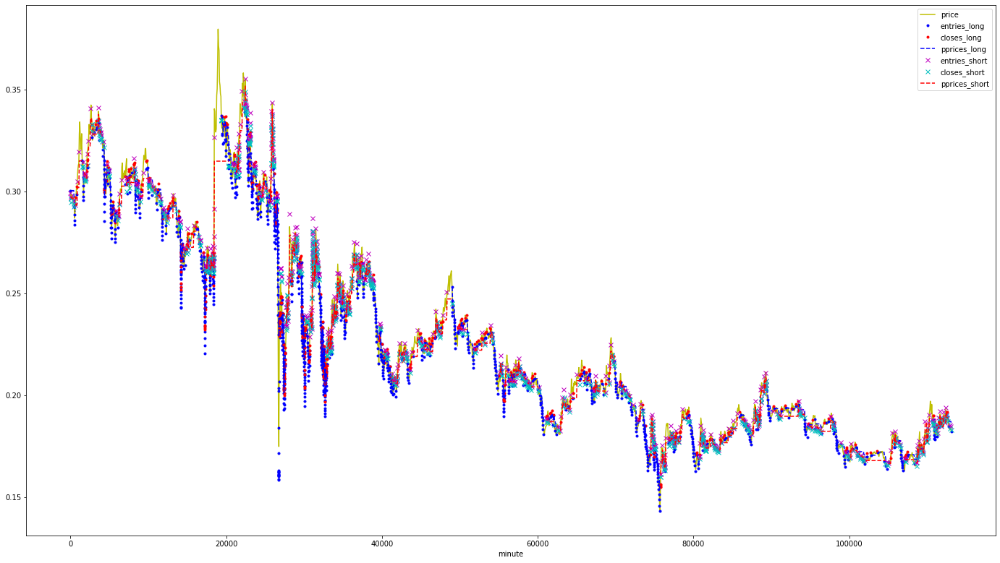

HOTUSDT


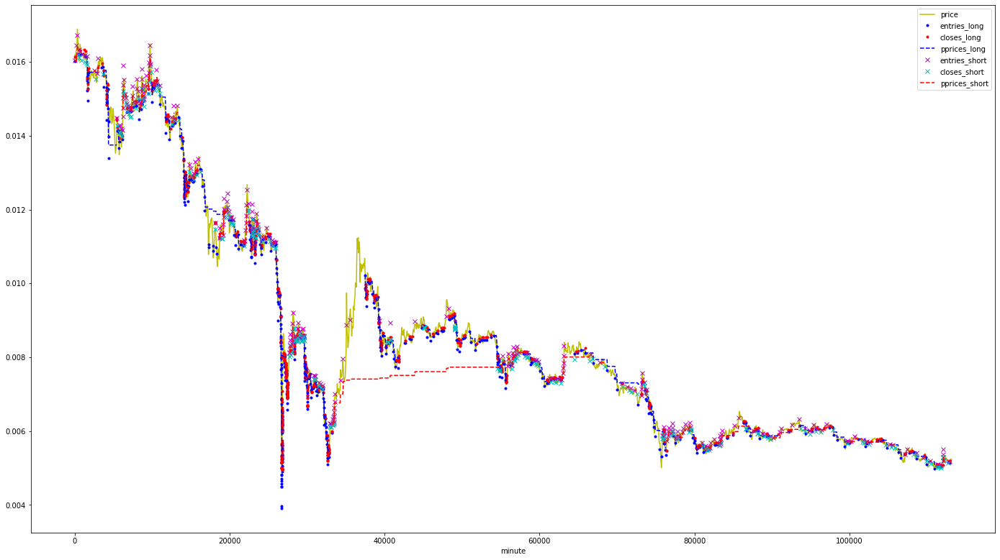

KSMUSDT


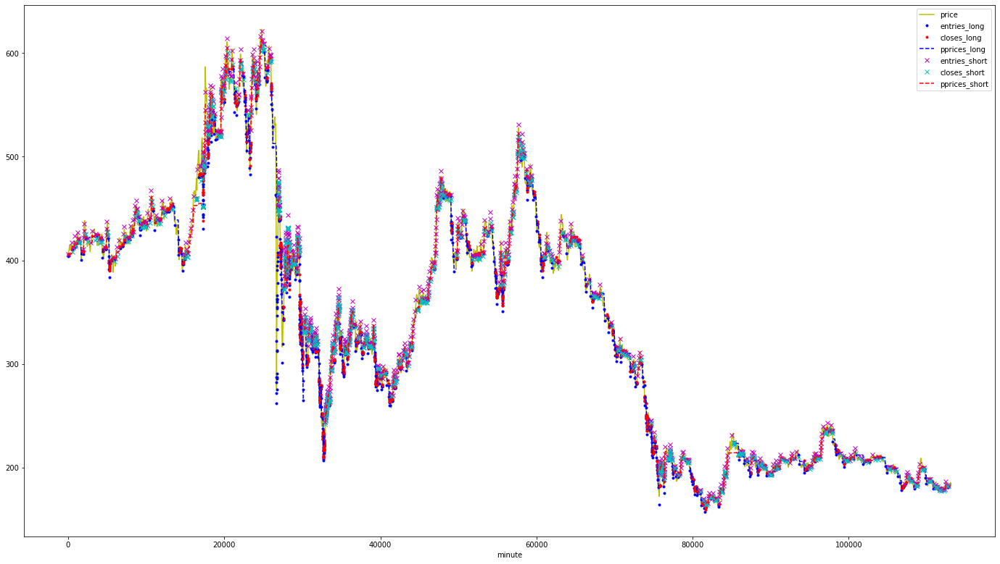

LITUSDT


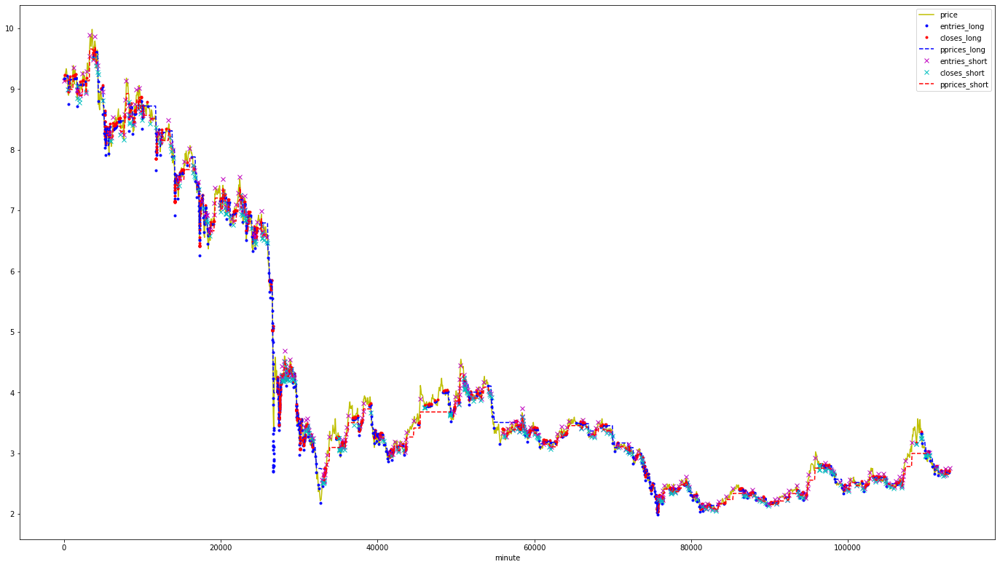

MKRUSDT


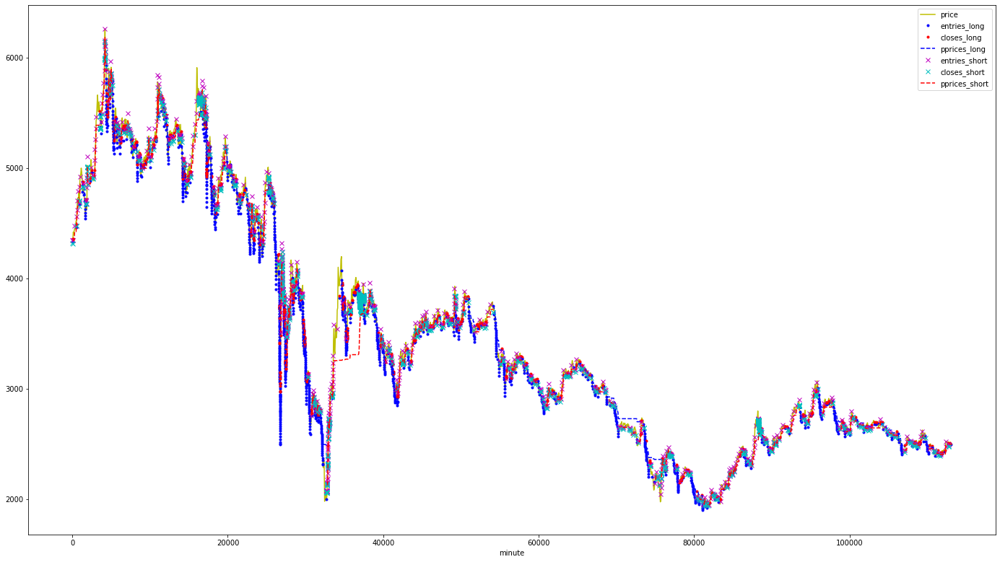

NKNUSDT


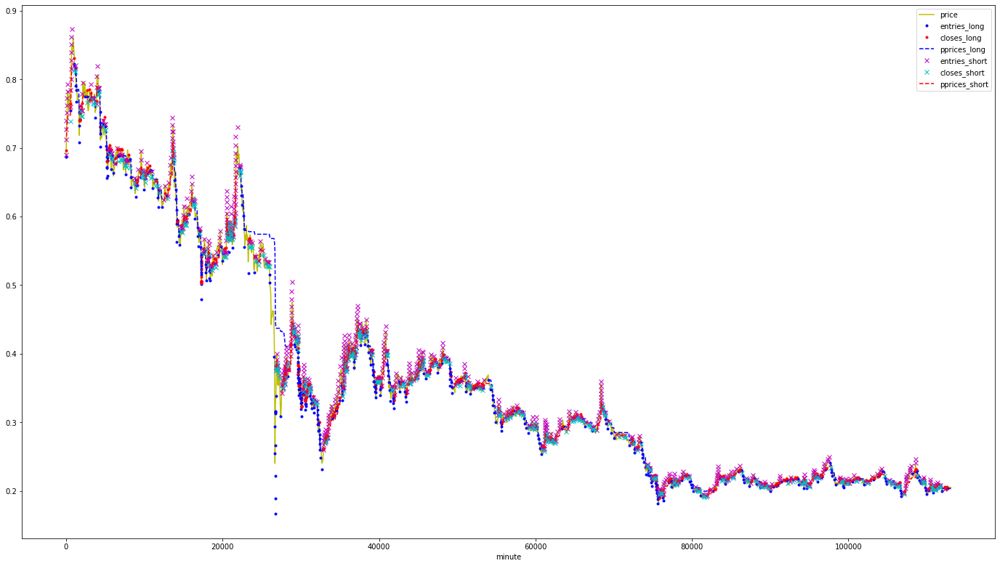

OCEANUSDT


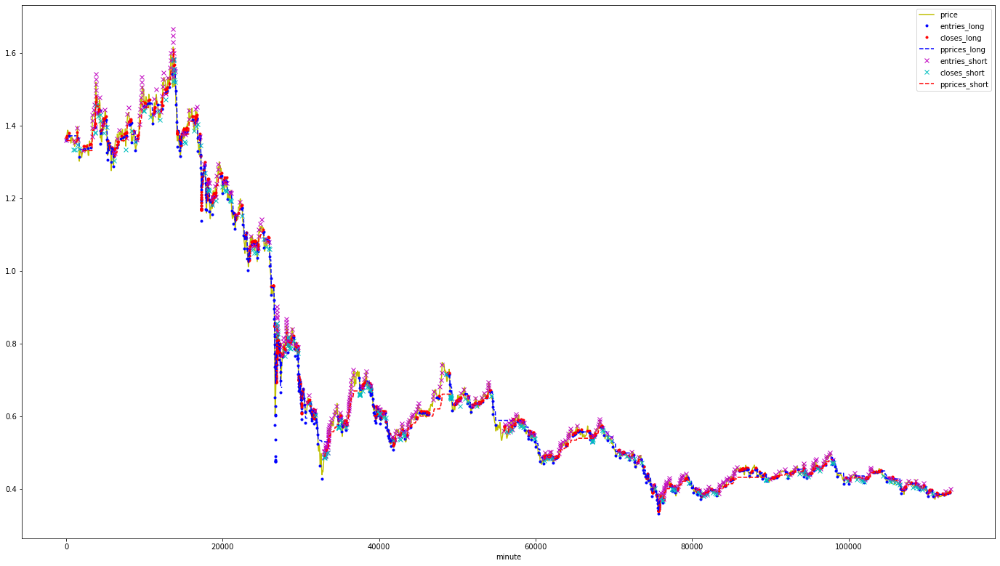

OMGUSDT


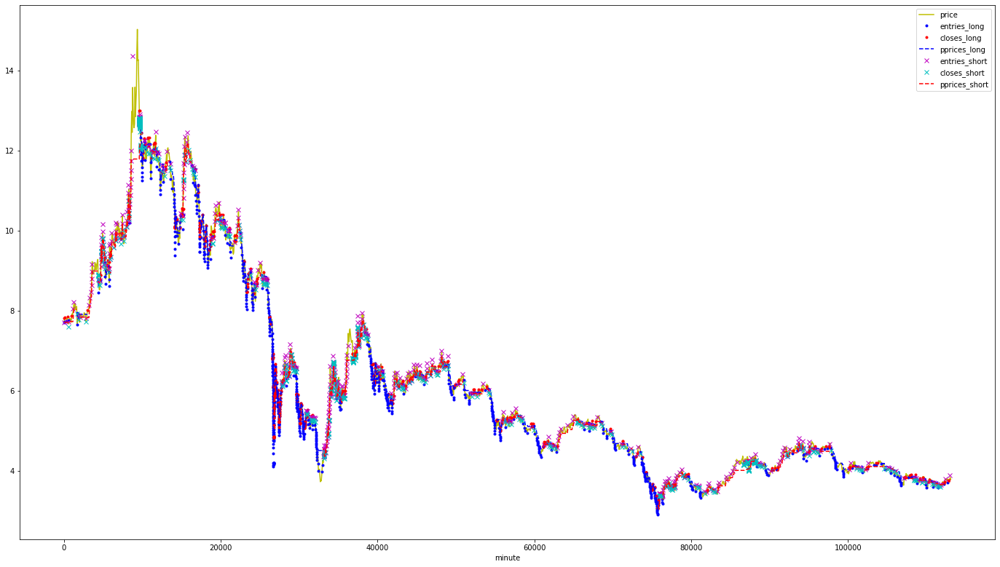

REEFUSDT


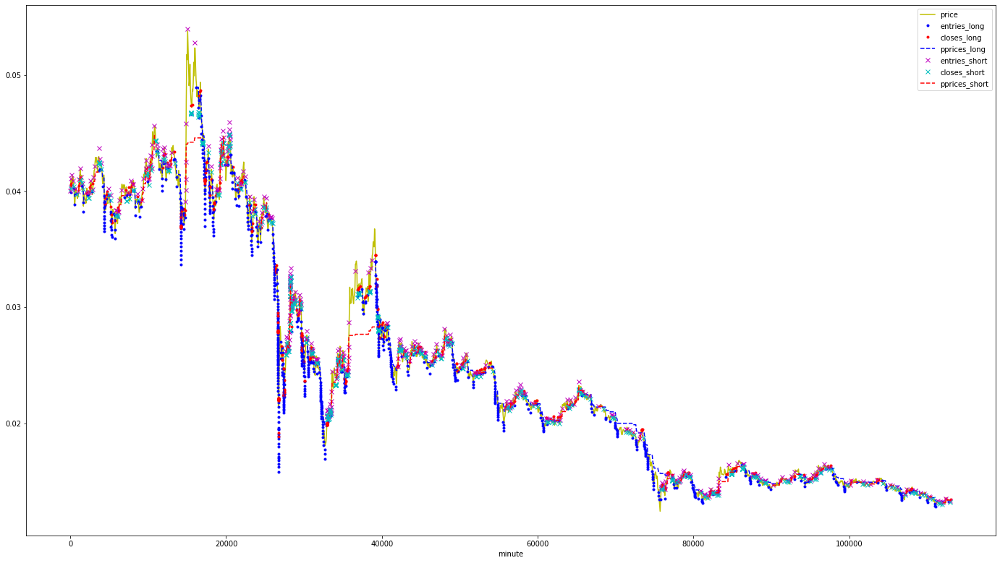

RLCUSDT


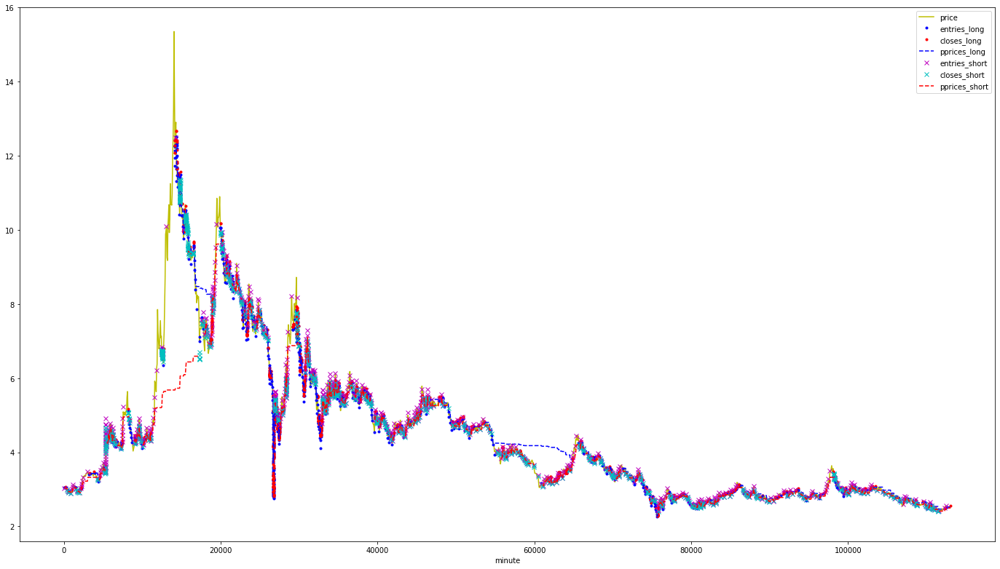

RSRUSDT


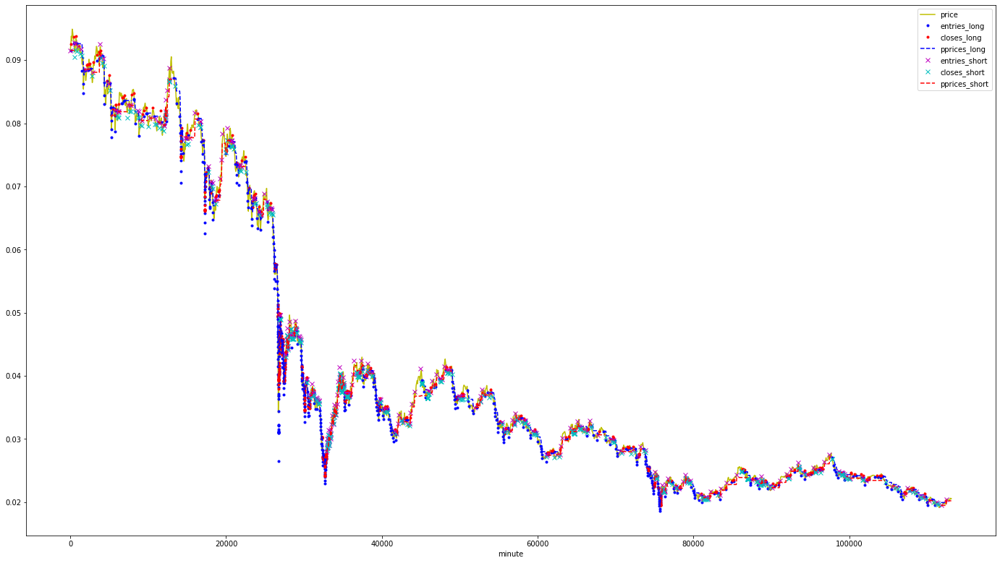

SFPUSDT


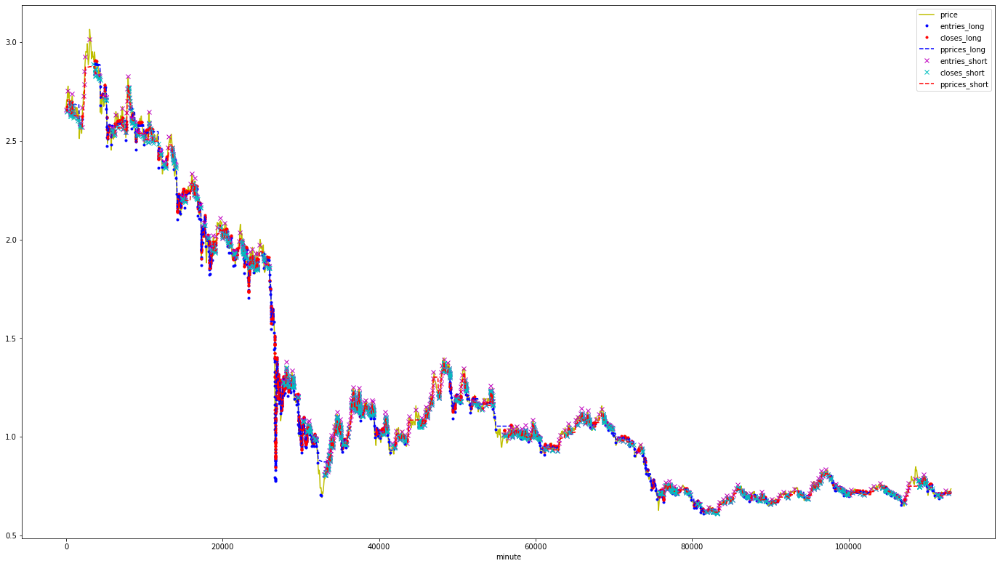

SNXUSDT


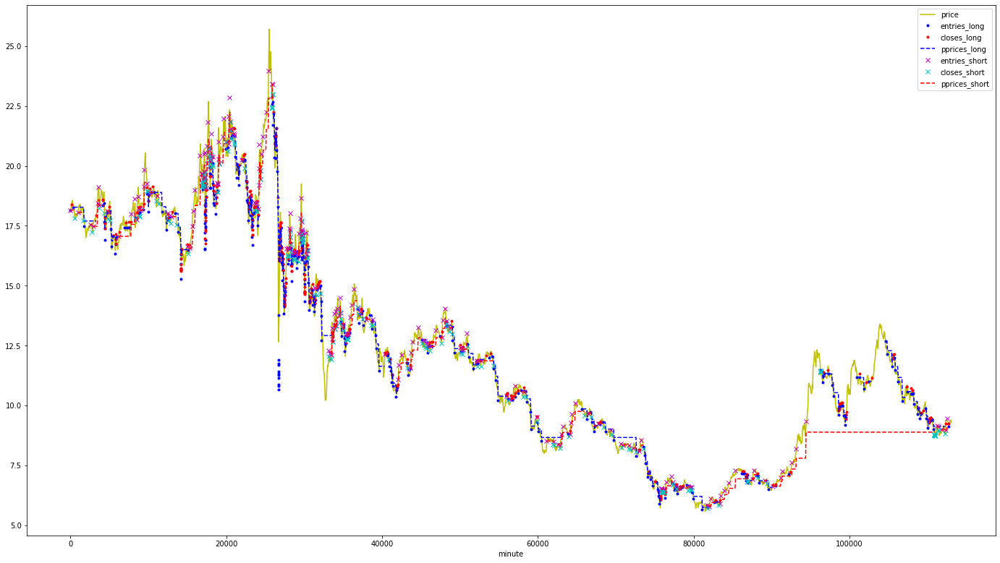

STMXUSDT


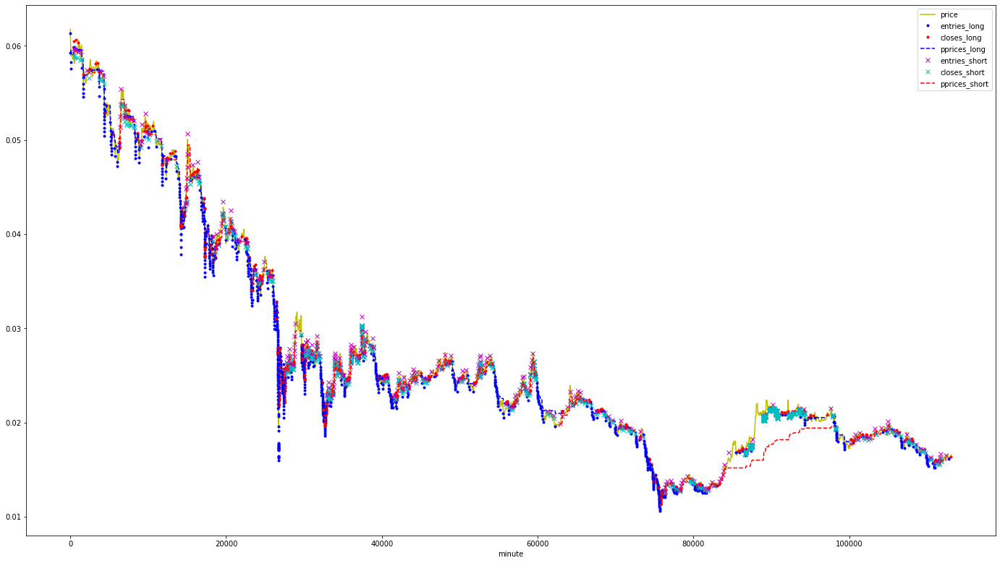

THETAUSDT


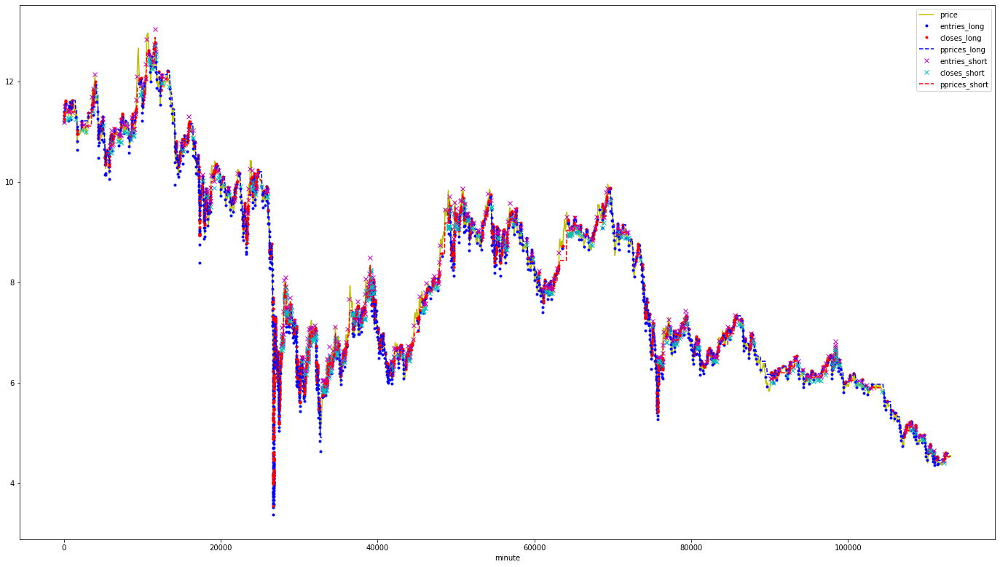

In [23]:
# inspect for each symbol
for symbol in symbols:
    print(symbol)
    plot_fills_multi(symbol, sdf.loc[wdls:wdle], fdf.loc[wdls:wdle]).show()

RLCUSDT_upnl_pct_s     -0.1812472390
SFPUSDT_upnl_pct_s     -0.1701403114
BANDUSDT_upnl_pct_s    -0.1301257787
CHRUSDT_upnl_pct_s     -0.1011548355
GRTUSDT_upnl_pct_s     -0.0923843697
NKNUSDT_upnl_pct_l     -0.0893598159
KSMUSDT_upnl_pct_l     -0.0711319835
SNXUSDT_upnl_pct_s     -0.0695715410
GRTUSDT_upnl_pct_l     -0.0659579951
OCEANUSDT_upnl_pct_s   -0.0584036699
SFPUSDT_upnl_pct_l     -0.0556852778
HOTUSDT_upnl_pct_s     -0.0551700261
RLCUSDT_upnl_pct_l     -0.0519319739
REEFUSDT_upnl_pct_s    -0.0503120312
OCEANUSDT_upnl_pct_l   -0.0467279349
LITUSDT_upnl_pct_s     -0.0433022569
SNXUSDT_upnl_pct_l     -0.0410567103
STMXUSDT_upnl_pct_s    -0.0399163555
HBARUSDT_upnl_pct_l    -0.0376158447
RSRUSDT_upnl_pct_s     -0.0375866211
THETAUSDT_upnl_pct_l   -0.0338577655
OMGUSDT_upnl_pct_s     -0.0334923261
REEFUSDT_upnl_pct_l    -0.0332196847
MKRUSDT_upnl_pct_l     -0.0329512109
LITUSDT_upnl_pct_l     -0.0305905838
MKRUSDT_upnl_pct_s     -0.0304307537
HOTUSDT_upnl_pct_l     -0.0299670881
T

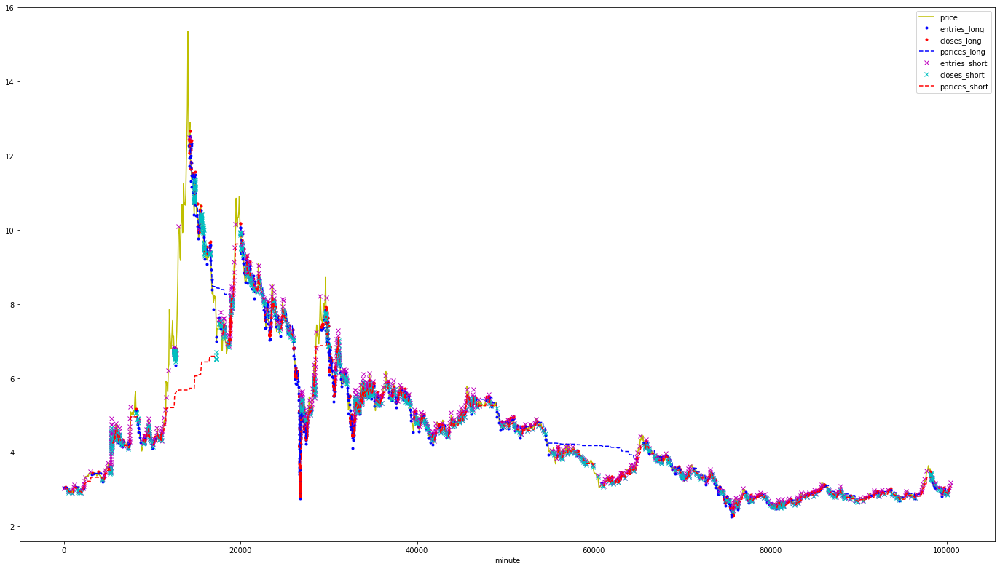

SFPUSDT_upnl_pct_s 239100


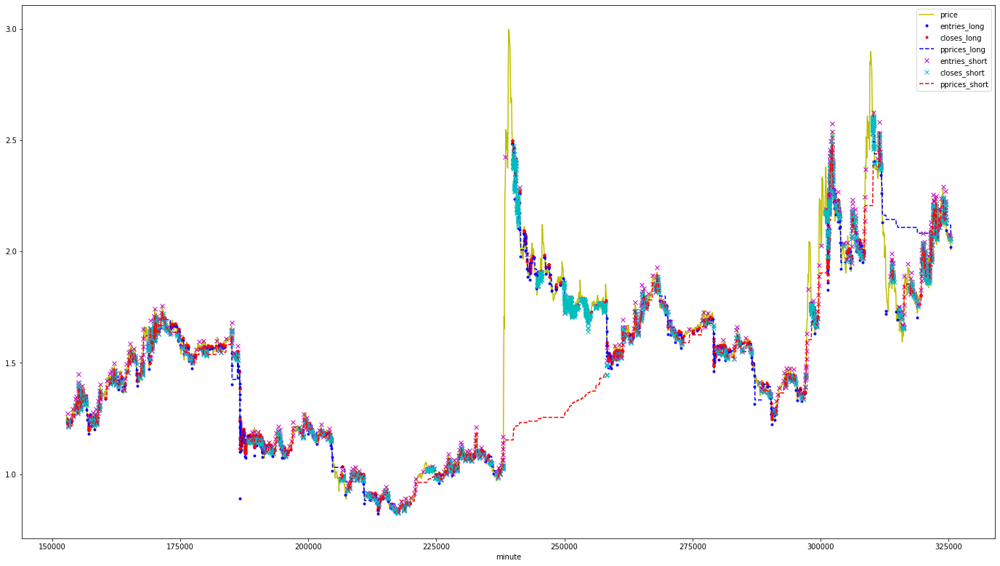

BANDUSDT_upnl_pct_s 795840


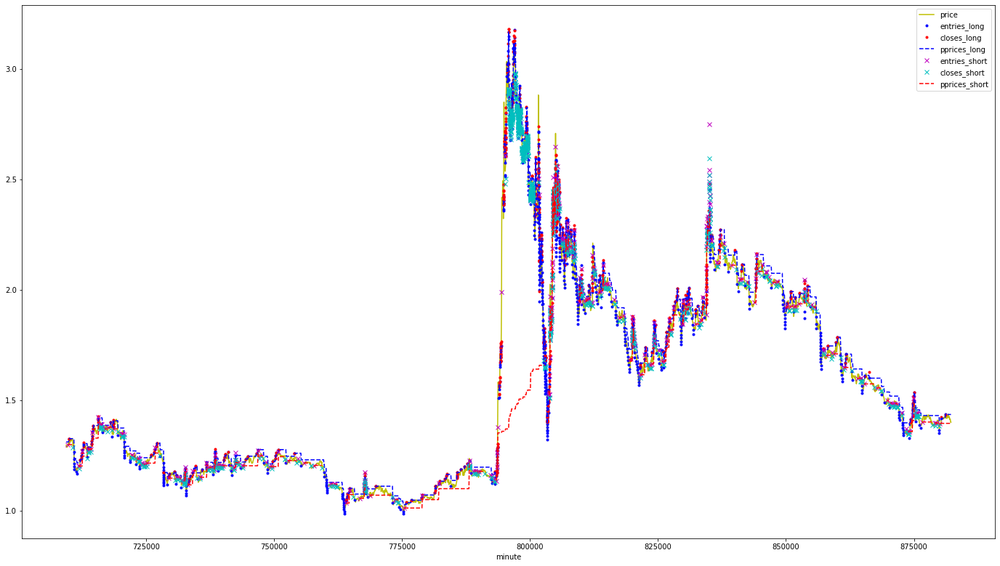

CHRUSDT_upnl_pct_s 279600


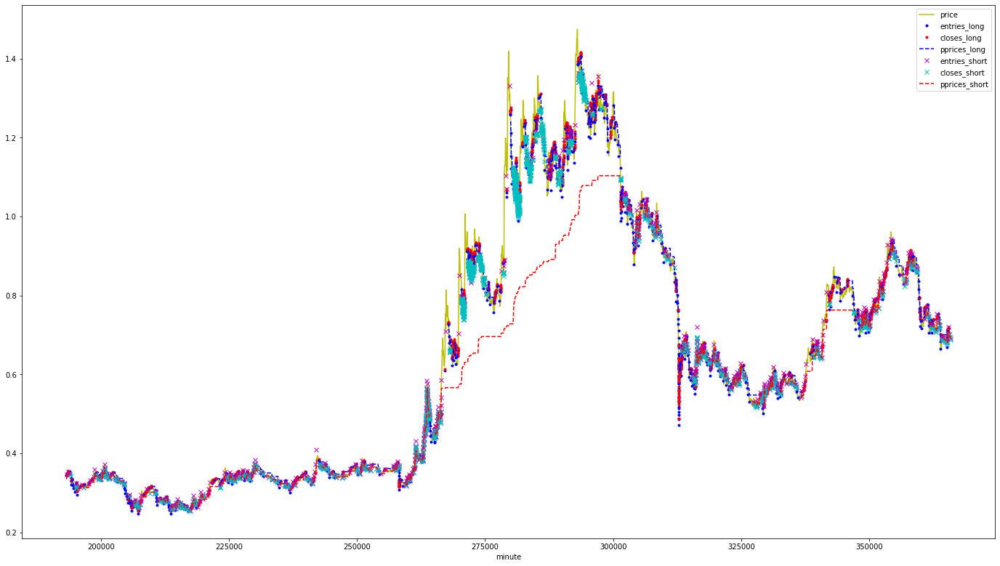

GRTUSDT_upnl_pct_s 932940


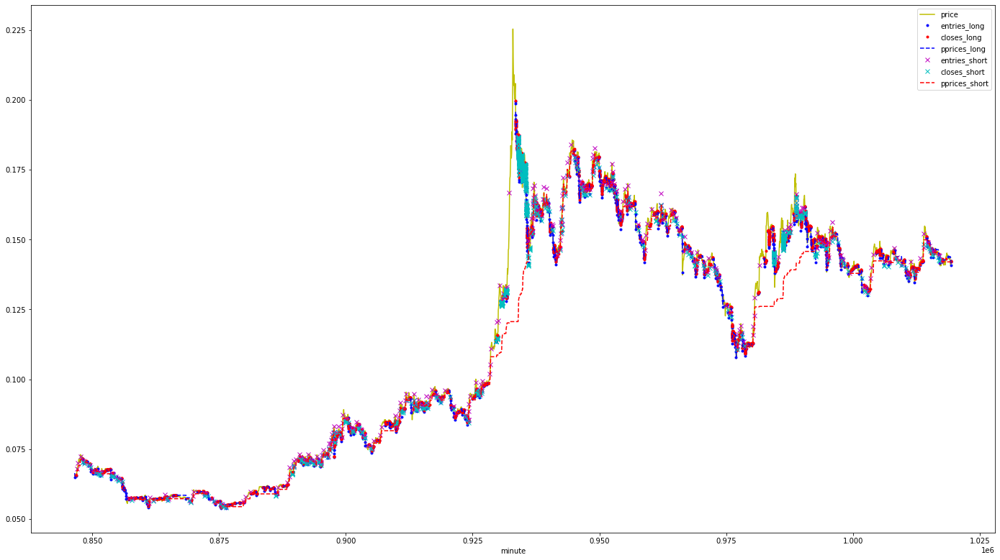

NKNUSDT_upnl_pct_l 26700


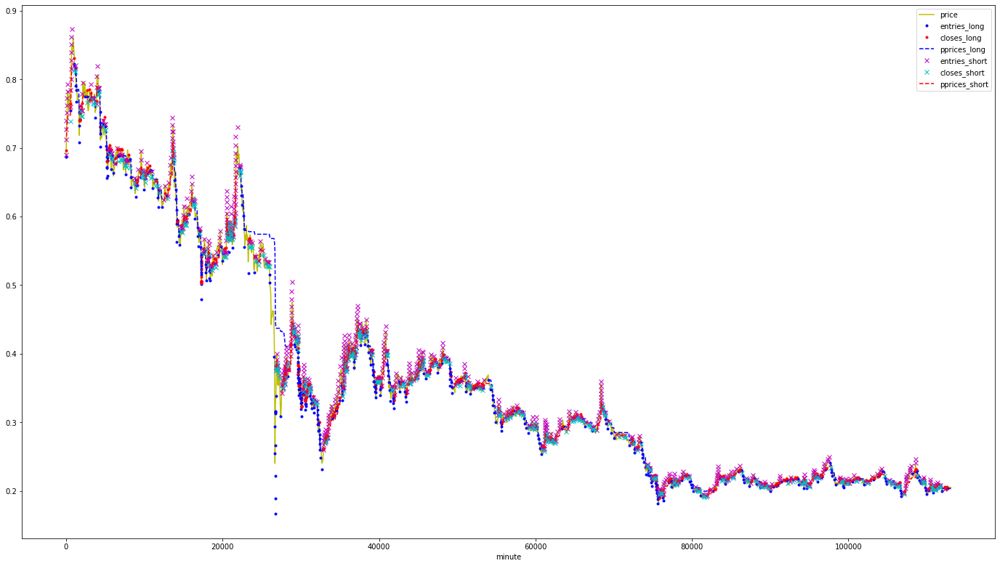

KSMUSDT_upnl_pct_l 26700


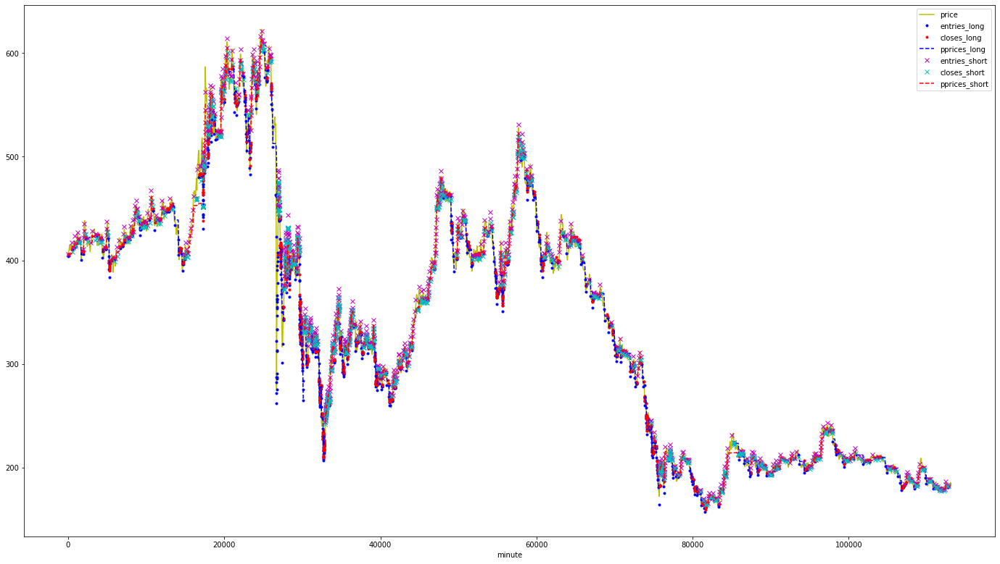

SNXUSDT_upnl_pct_s 600780


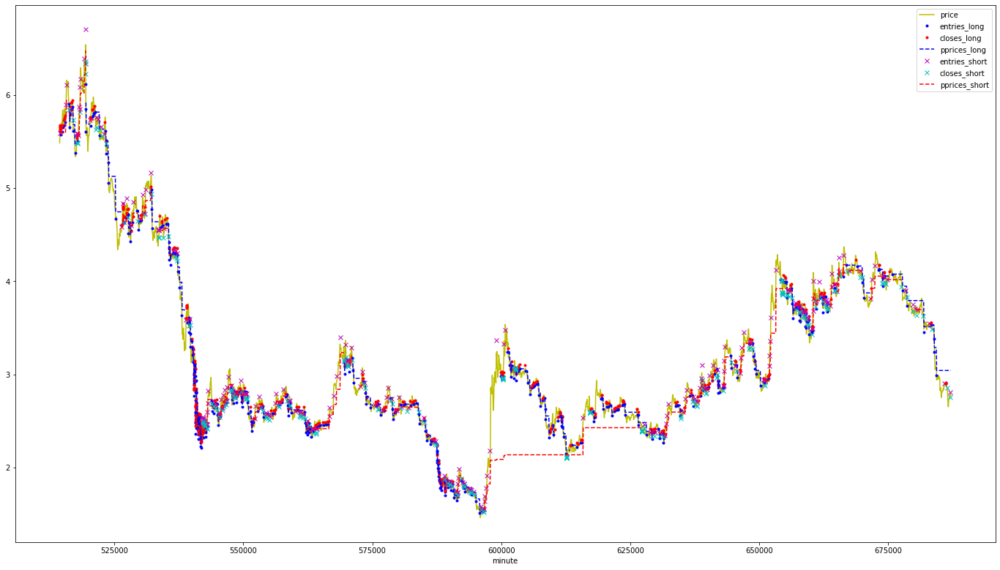

GRTUSDT_upnl_pct_l 26700


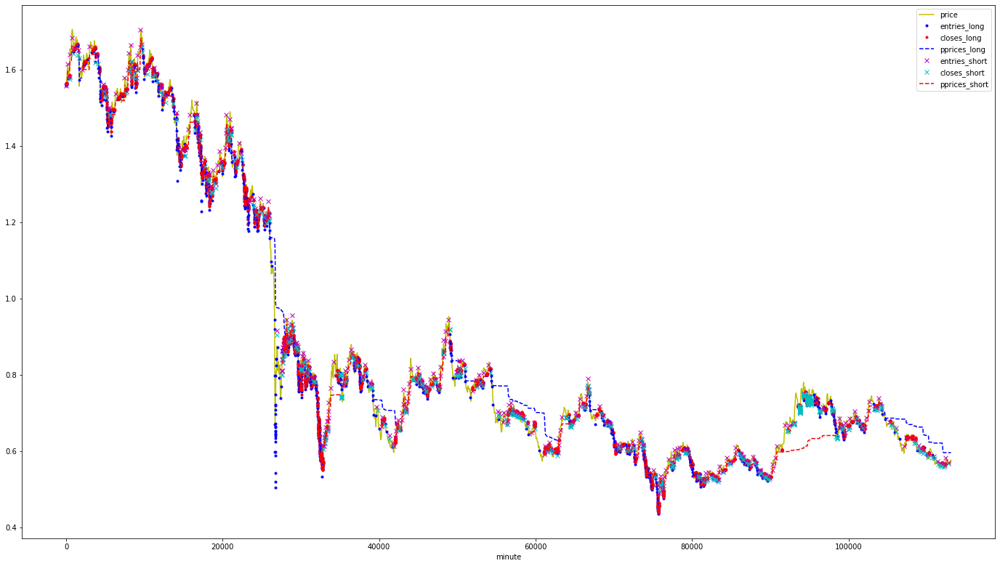

OCEANUSDT_upnl_pct_s 161700


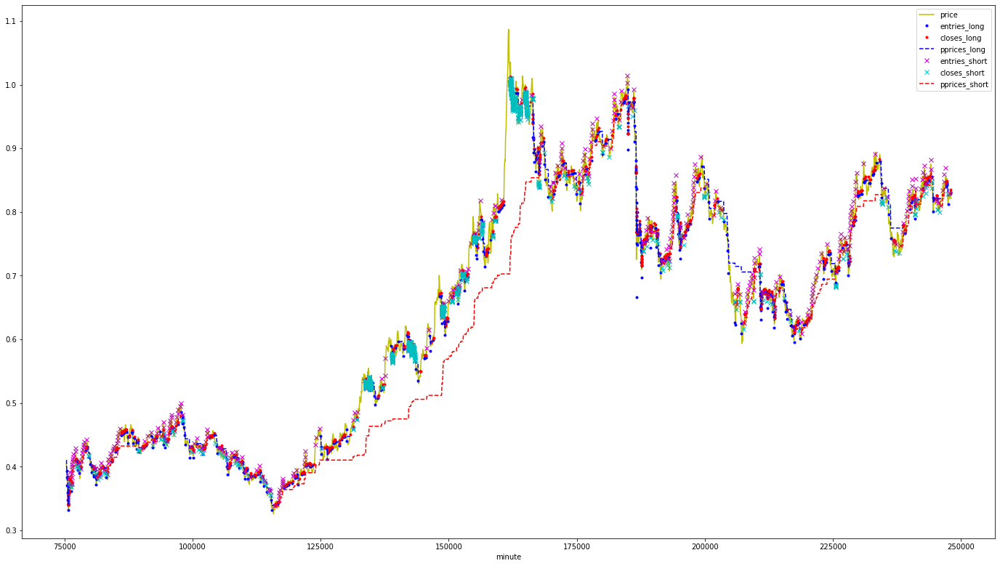

SFPUSDT_upnl_pct_l 541860


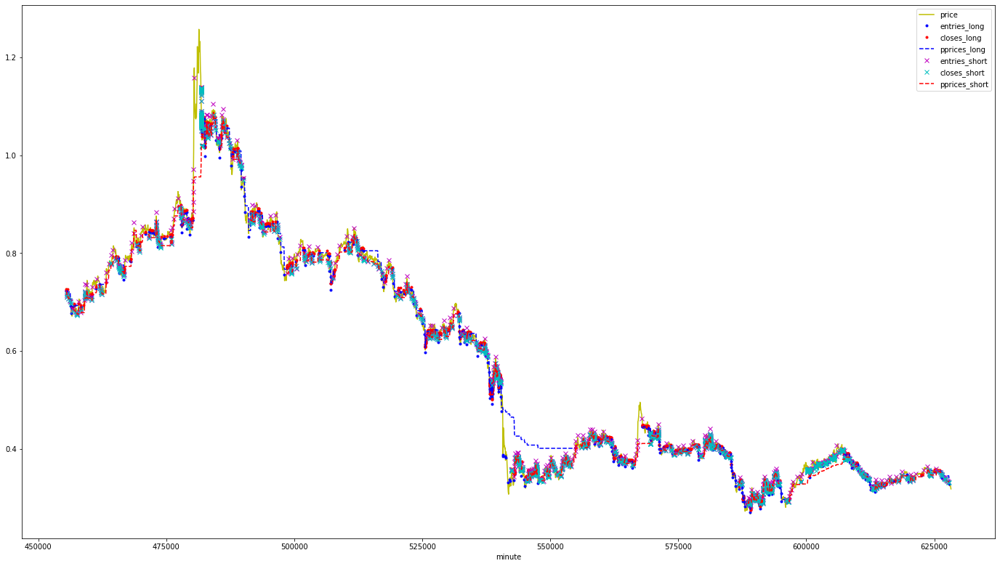

HOTUSDT_upnl_pct_s 36600


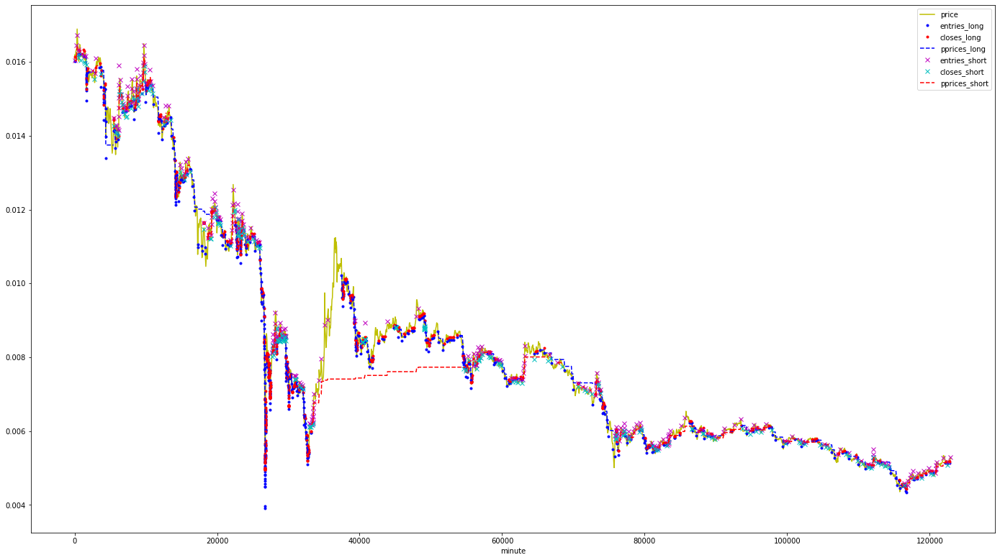

RLCUSDT_upnl_pct_l 386760


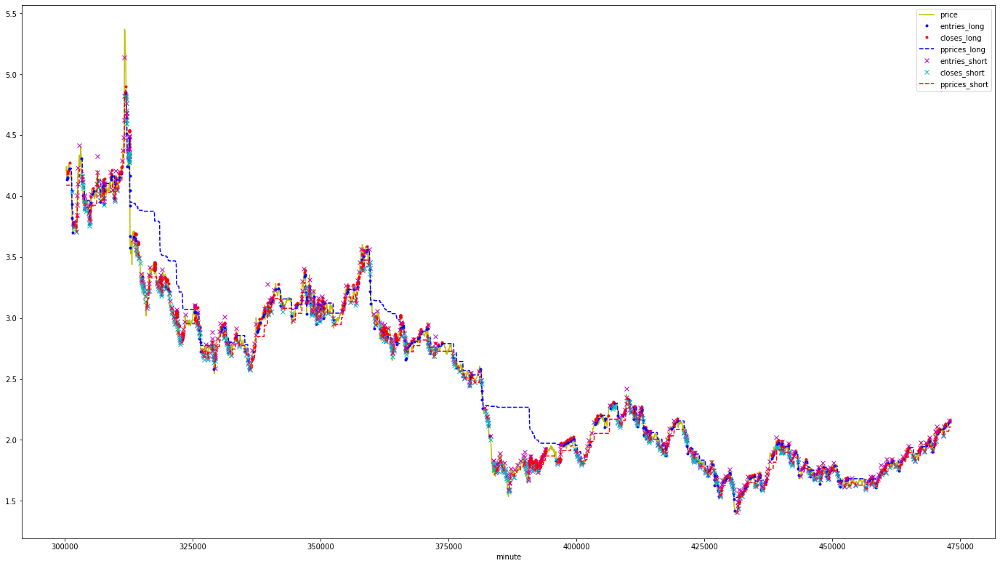

REEFUSDT_upnl_pct_s 242820


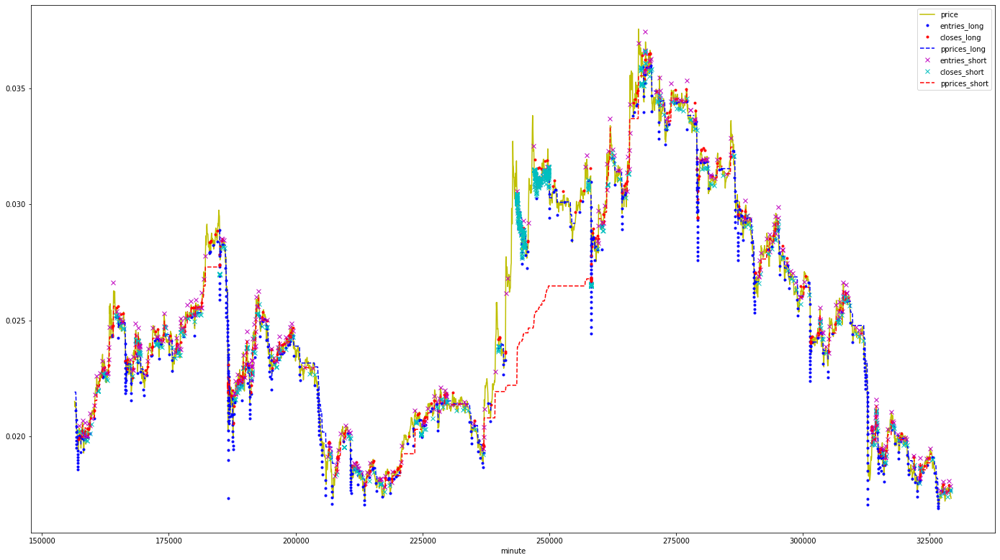

OCEANUSDT_upnl_pct_l 803460


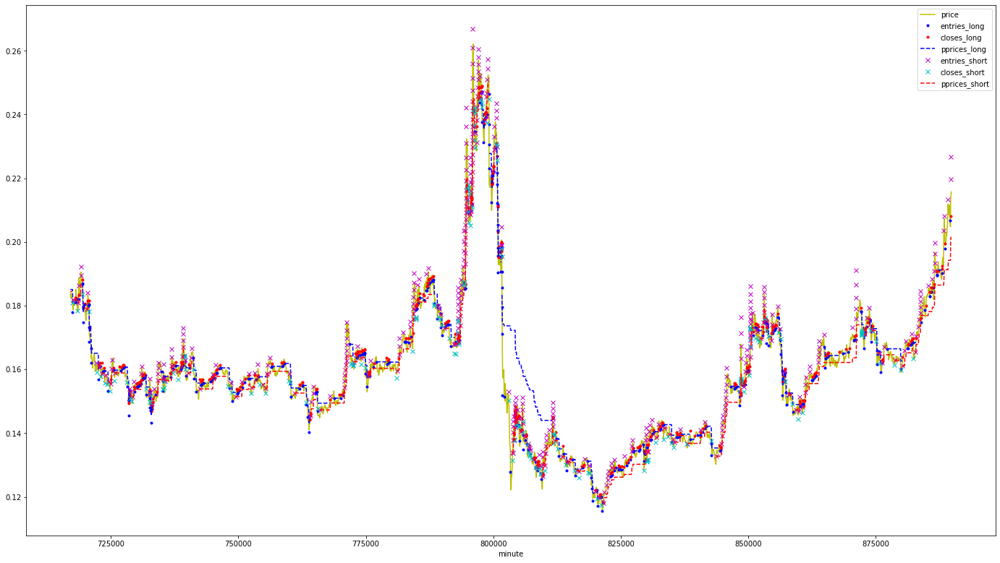

LITUSDT_upnl_pct_s 304260


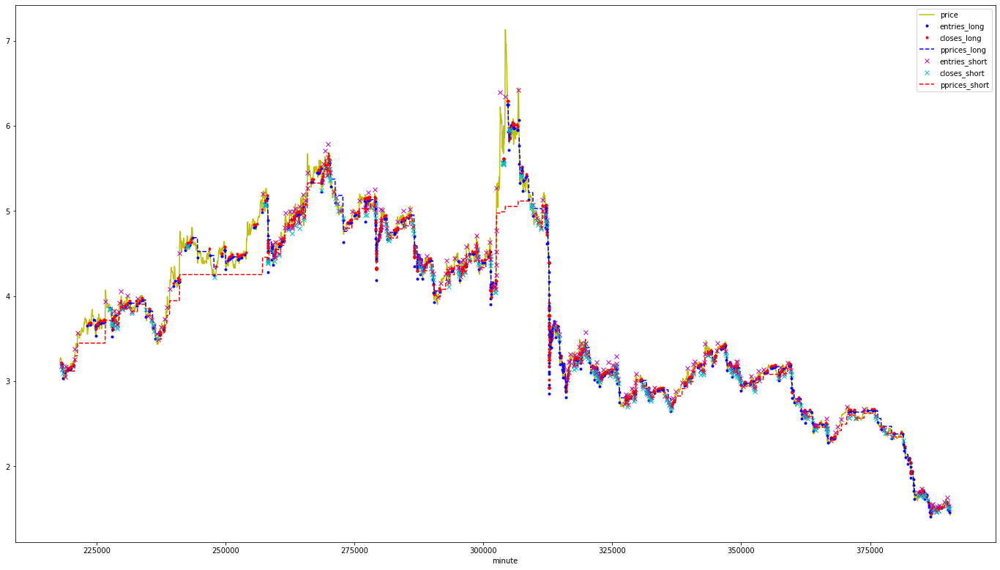

SNXUSDT_upnl_pct_l 26700


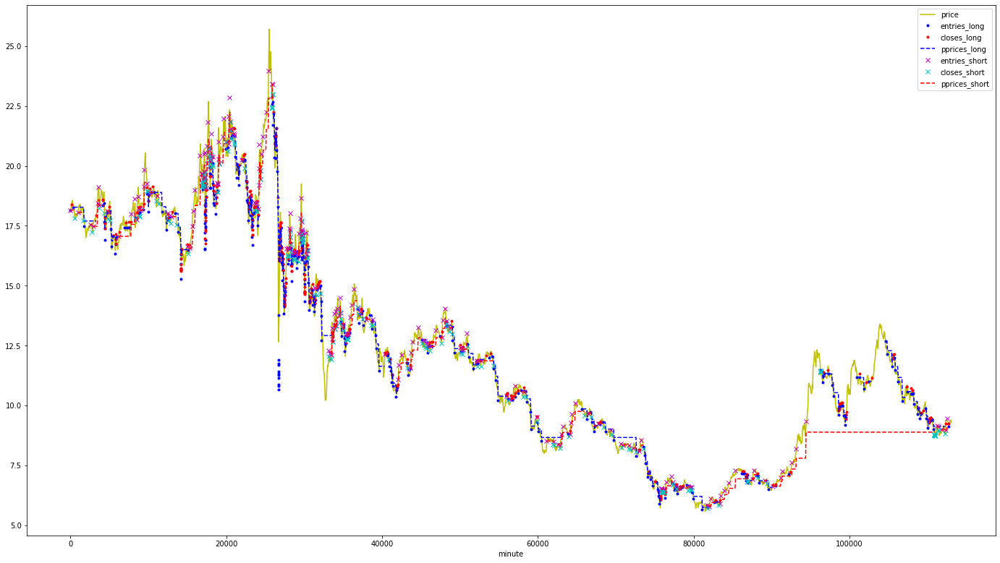

STMXUSDT_upnl_pct_s 88200


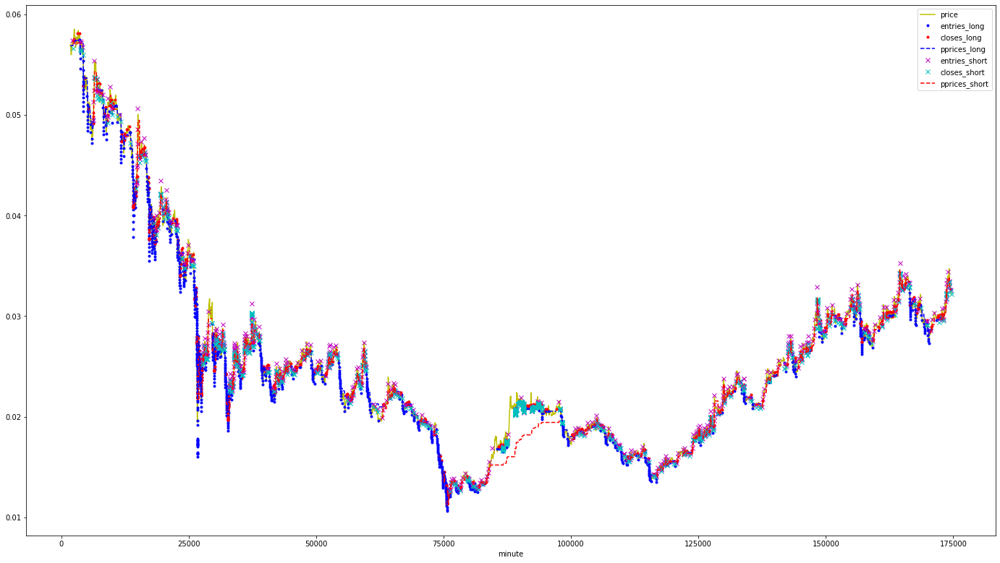

HBARUSDT_upnl_pct_l 26760


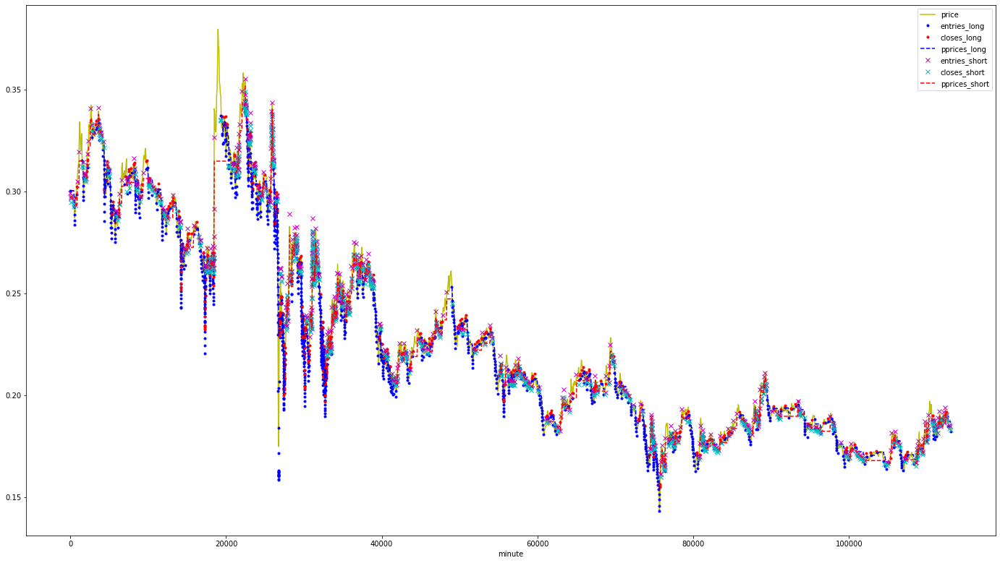

RSRUSDT_upnl_pct_s 568320


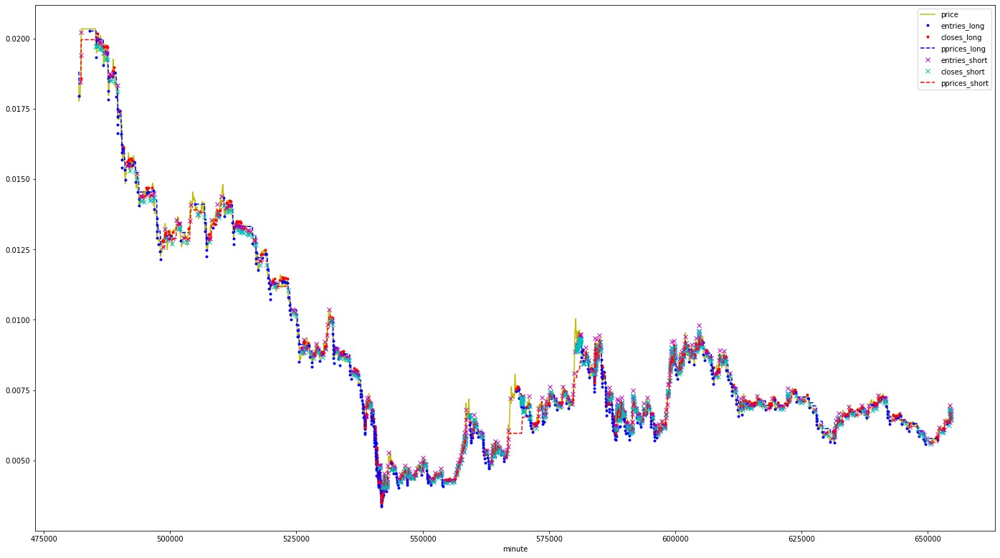

THETAUSDT_upnl_pct_l 386760


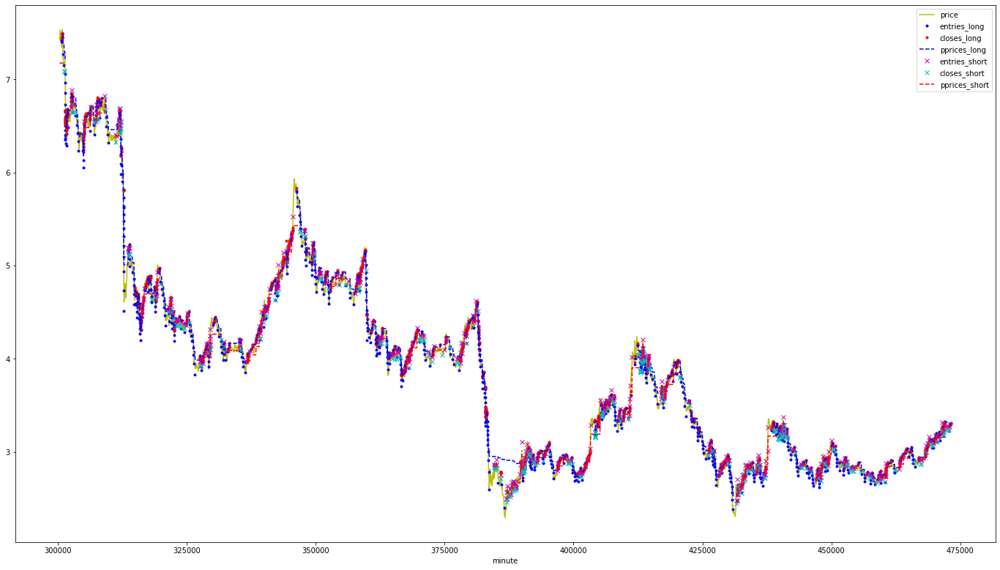

OMGUSDT_upnl_pct_s 1129860


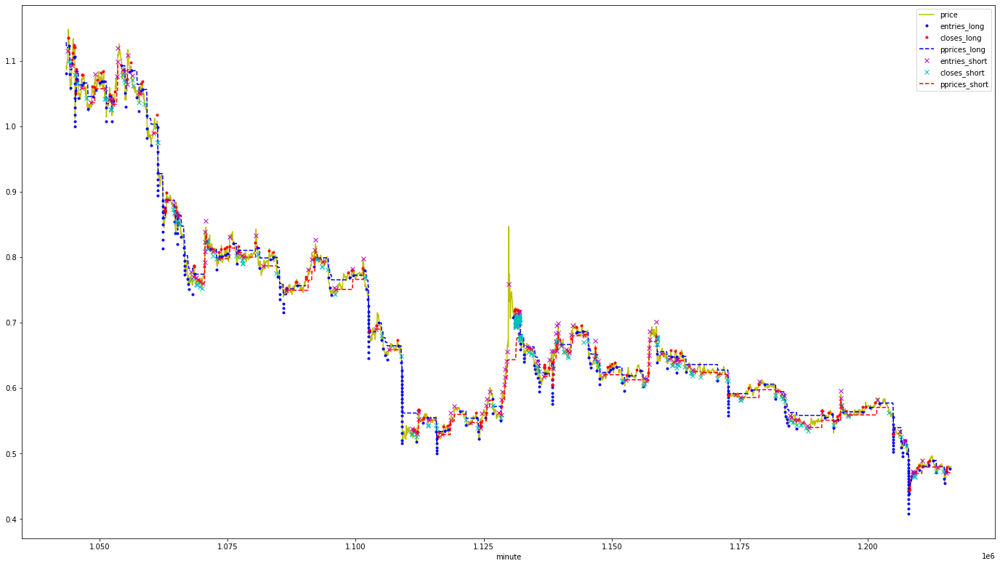

REEFUSDT_upnl_pct_l 75720


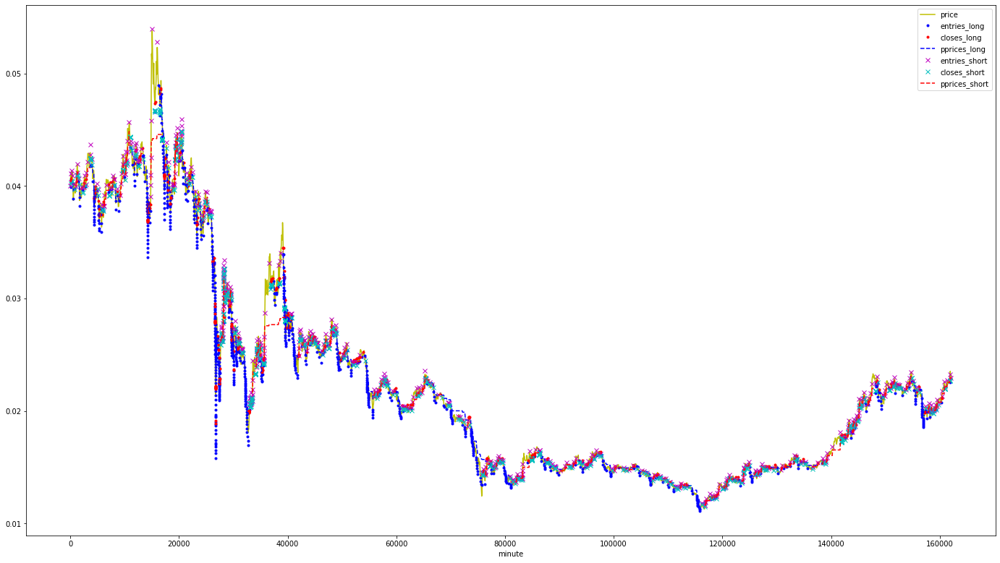

MKRUSDT_upnl_pct_l 32460


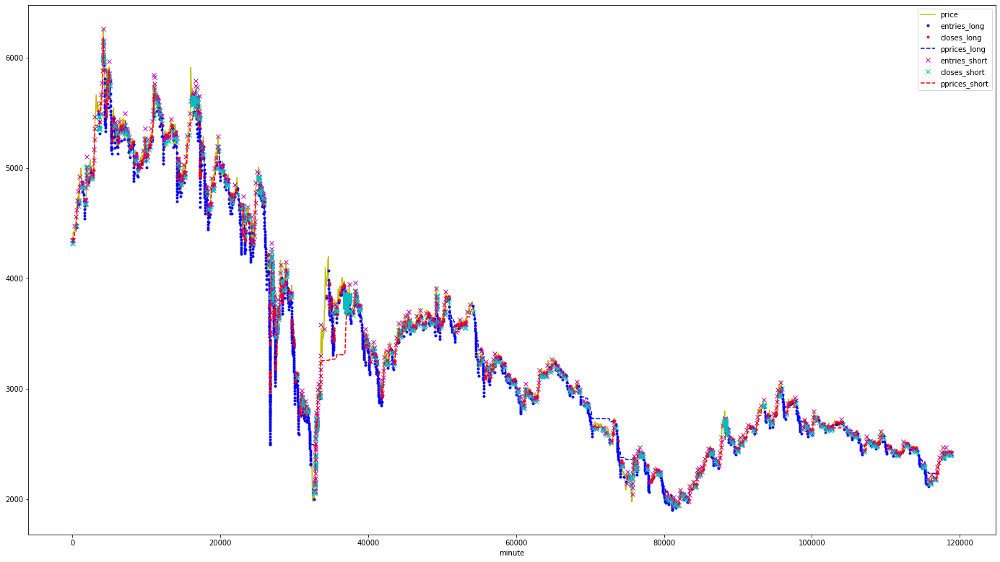

LITUSDT_upnl_pct_l 32700


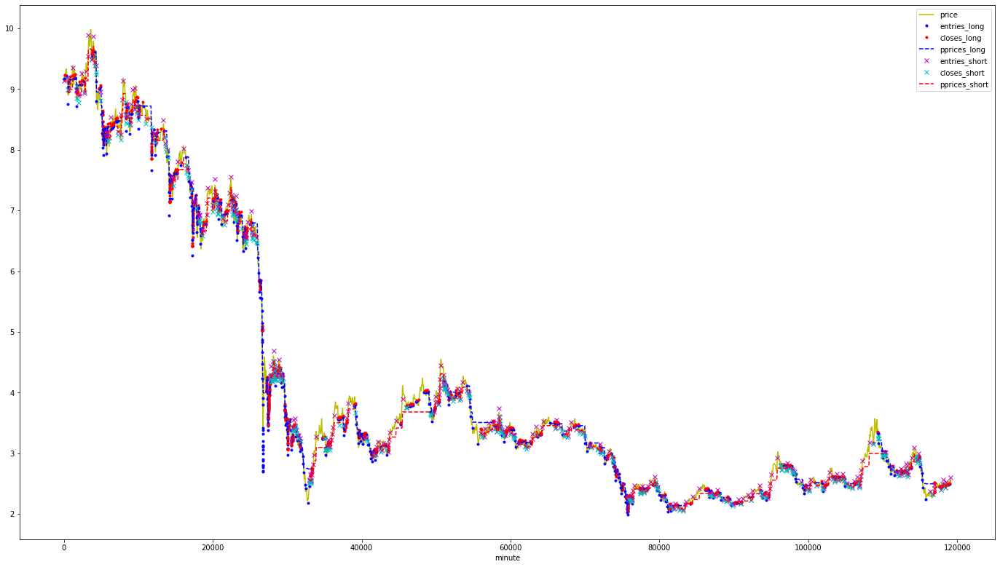

MKRUSDT_upnl_pct_s 34620


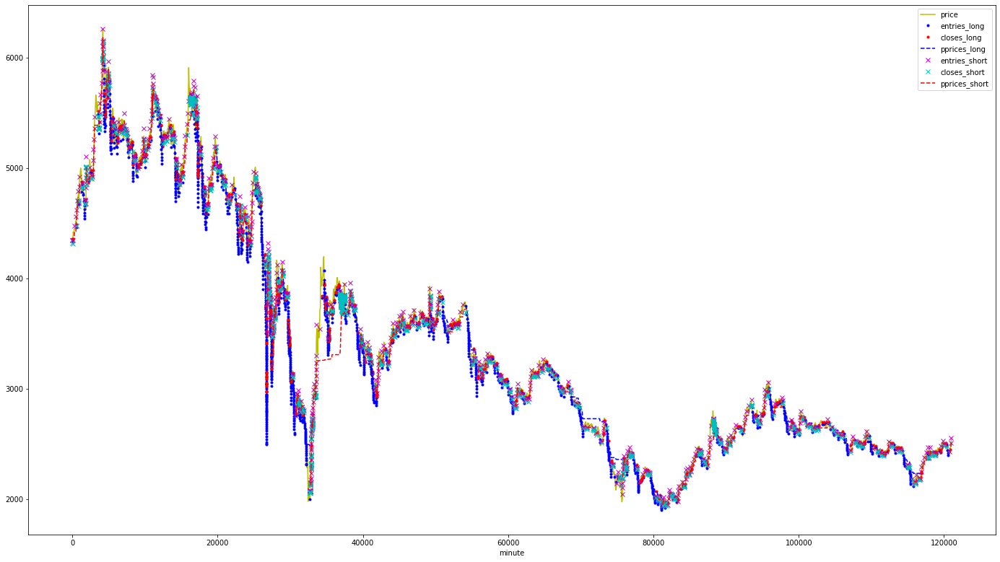

HOTUSDT_upnl_pct_l 26700


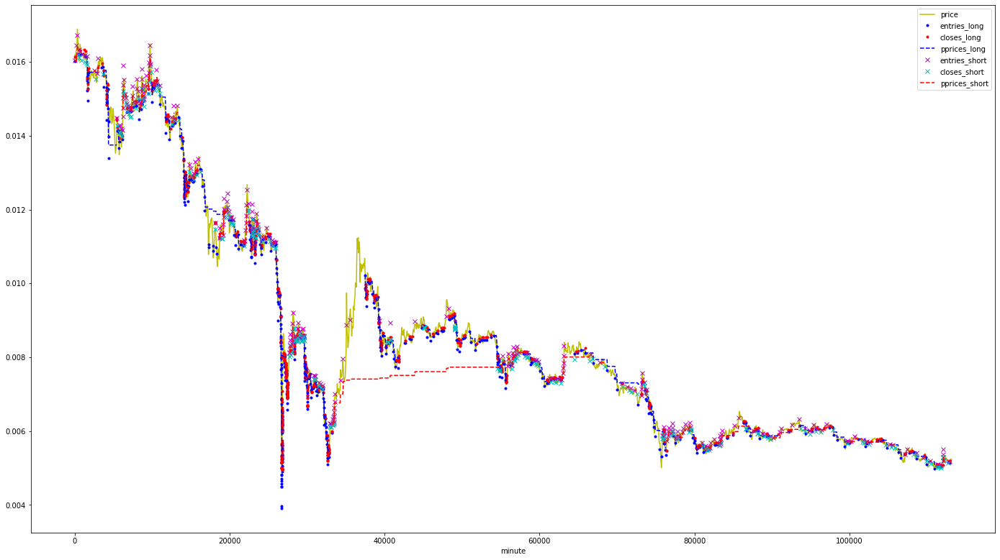

THETAUSDT_upnl_pct_s 257400


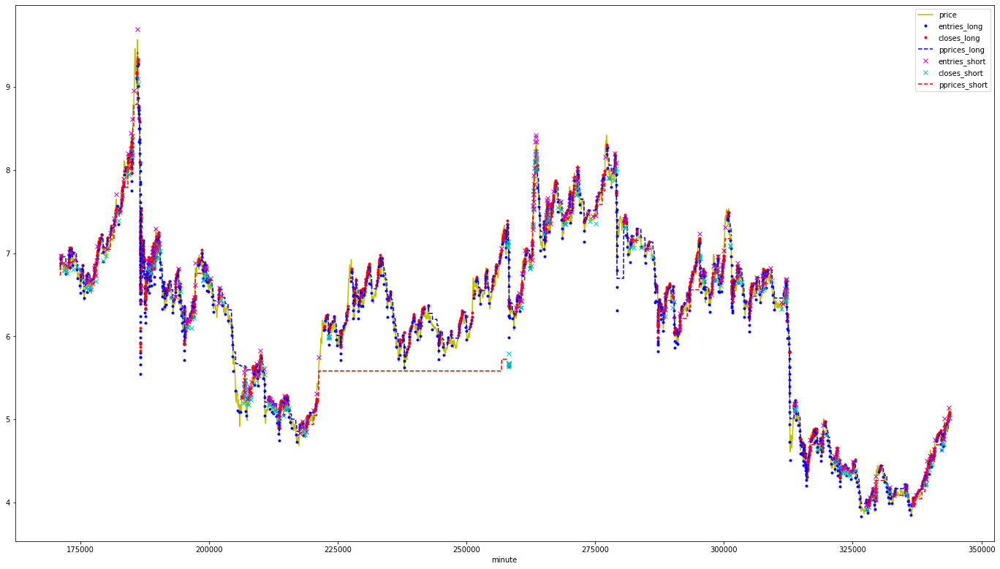

NKNUSDT_upnl_pct_s 634200


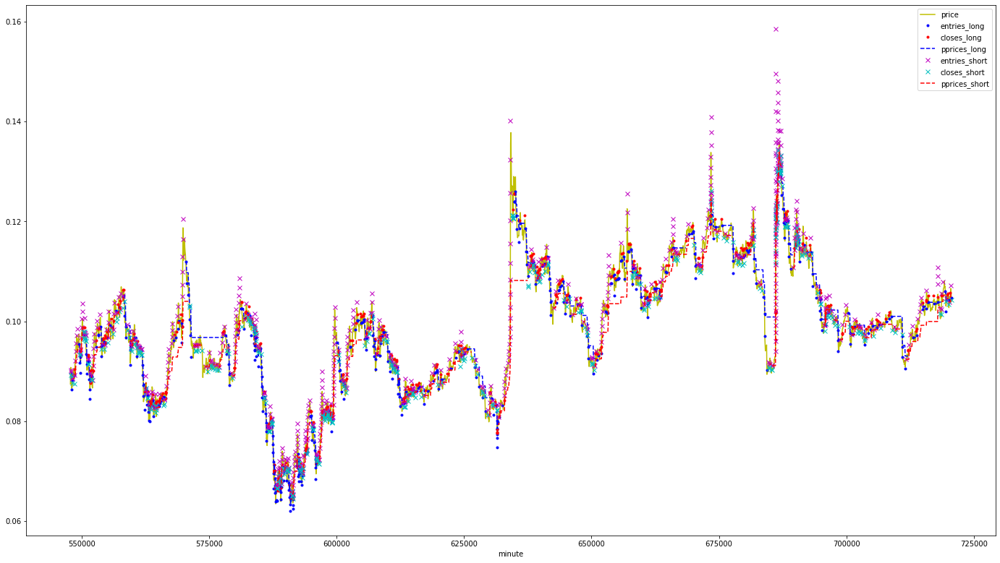

CELRUSDT_upnl_pct_l 542040


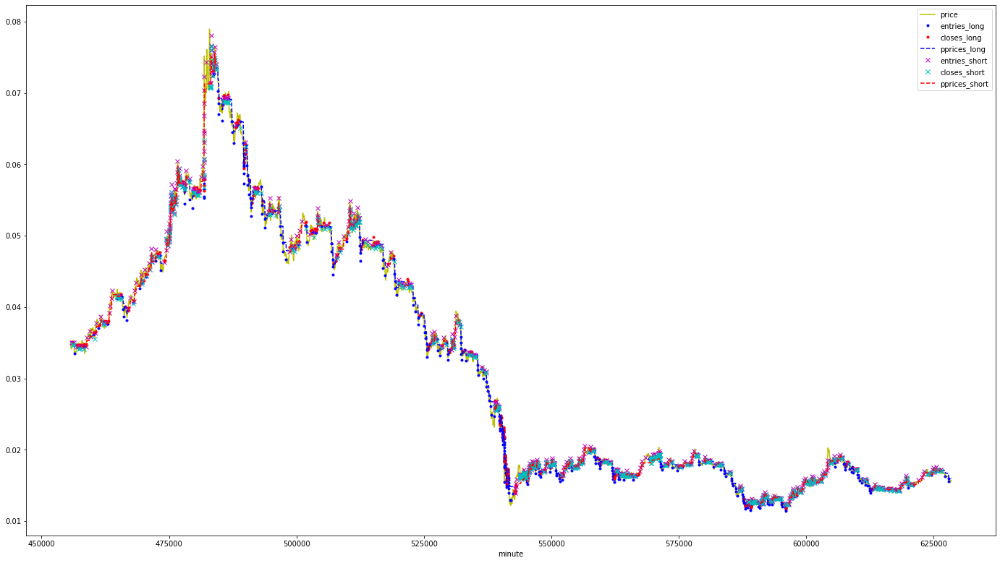

CELRUSDT_upnl_pct_s 200580


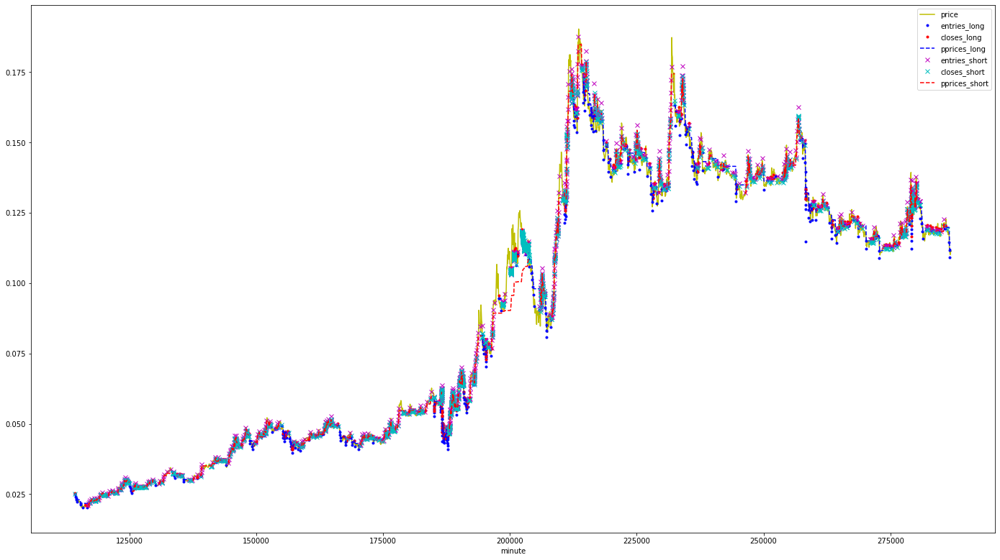

STMXUSDT_upnl_pct_l 383640


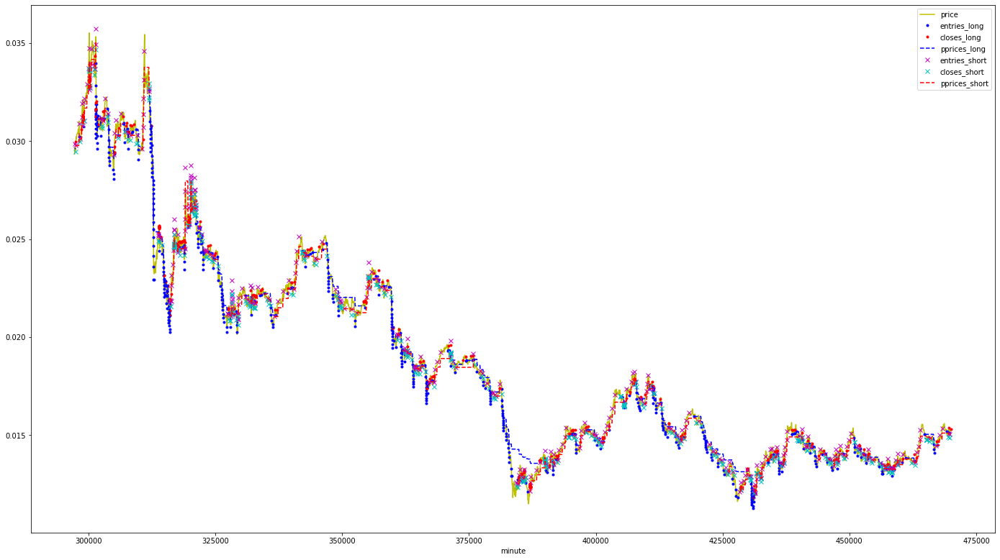

OMGUSDT_upnl_pct_l 32700


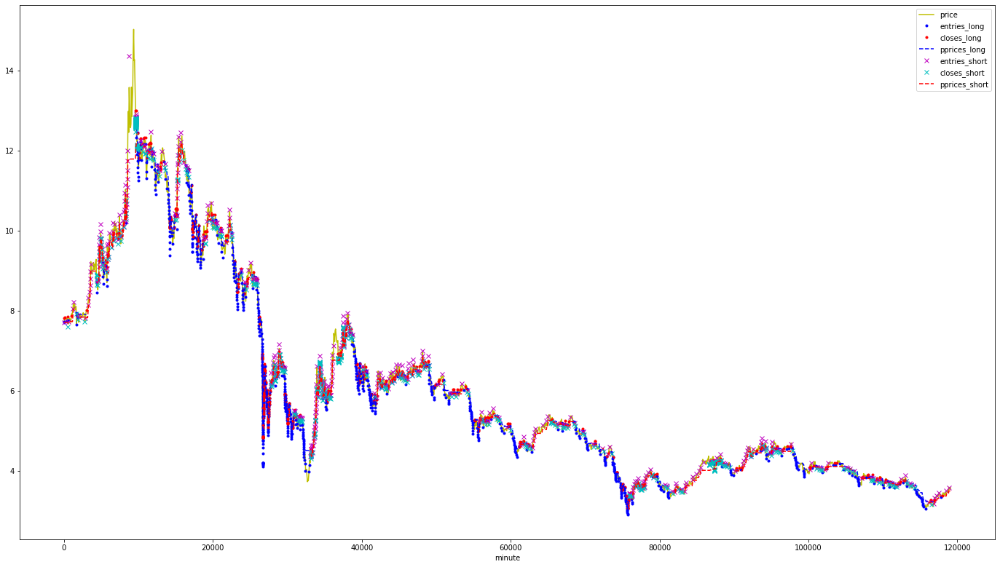

RSRUSDT_upnl_pct_l 26700


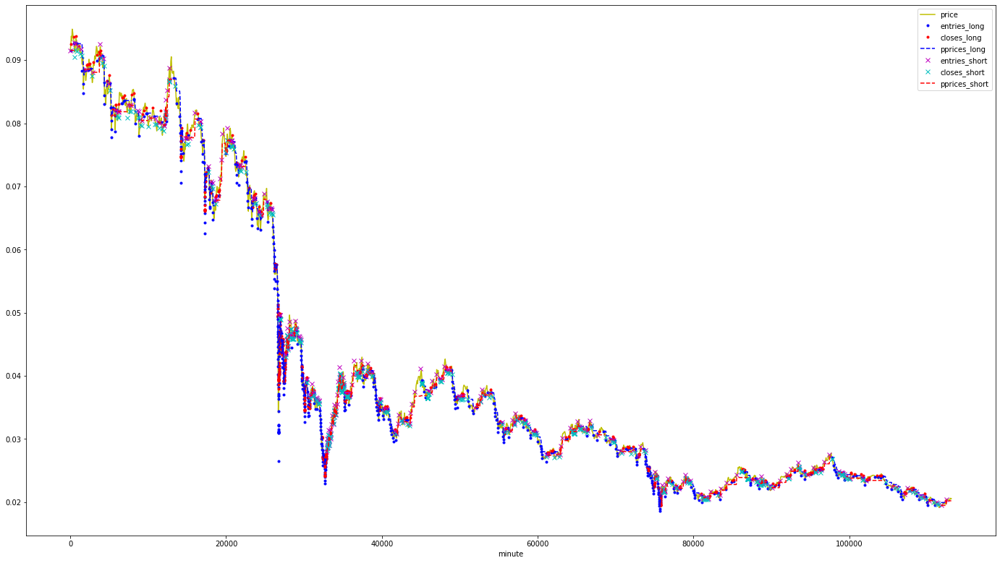

KSMUSDT_upnl_pct_s 949800


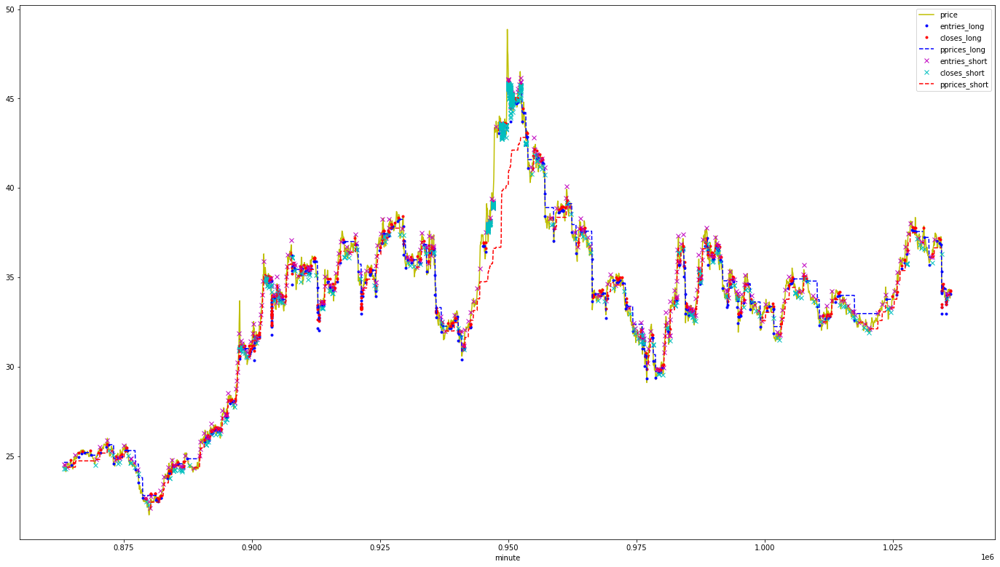

BANDUSDT_upnl_pct_l 187680


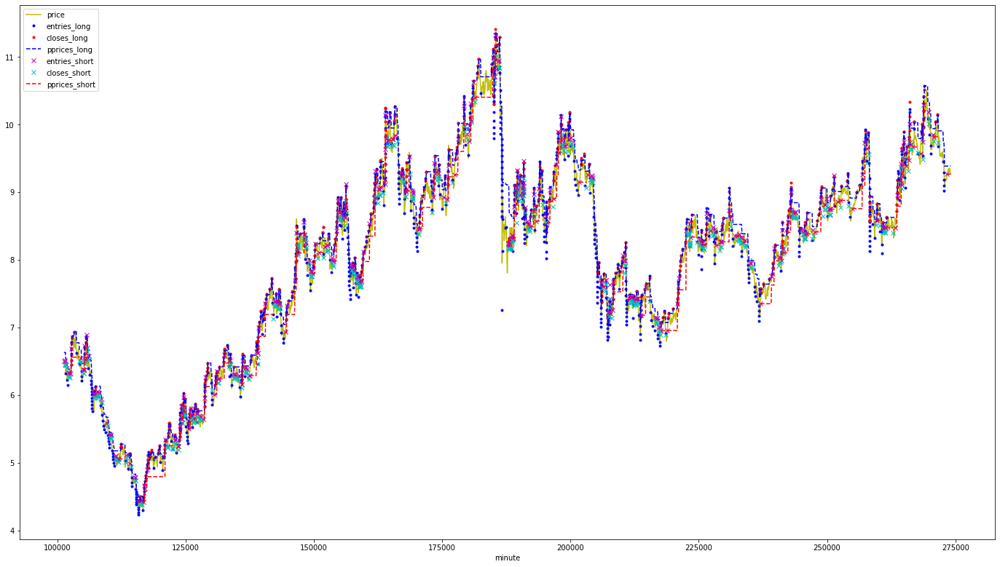

HBARUSDT_upnl_pct_s 907020


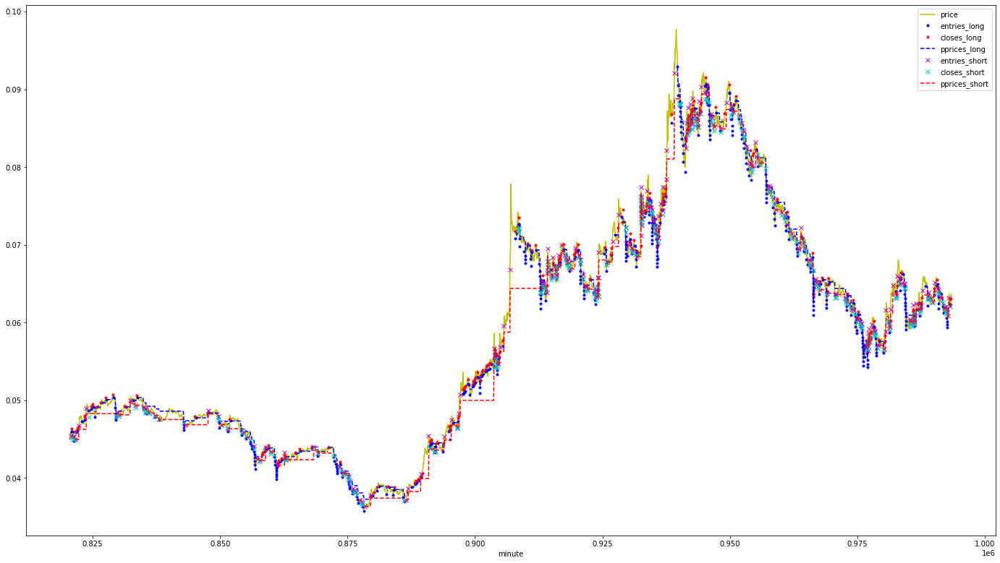

CHRUSDT_upnl_pct_l 541740


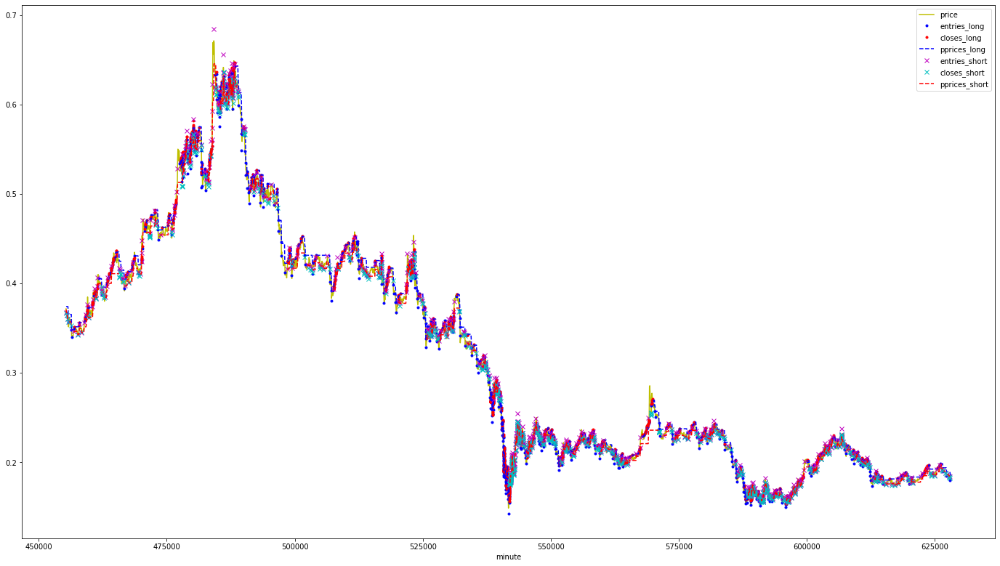

In [24]:
# inspect individual lowest drawdowns
upnl_pct_mins = sdf[[c for c in sdf.columns if "upnl" in c]].min().sort_values()
print(upnl_pct_mins)
print()
n = 60 * 24 * 60
upnl_pct_idxs = dict(sdf[[c for c in sdf.columns if "upnl" in c]].idxmin())
for sym in dict(upnl_pct_mins):
    idx = upnl_pct_idxs[sym]
    if np.isnan(idx):
        continue
    print(sym, idx)
    plot_fills_multi(
        sym[: sym.find("_")], sdf.loc[idx - n : idx + n], fdf.loc[idx - n : idx + n]
    ).show()

<AxesSubplot:xlabel='minute'>

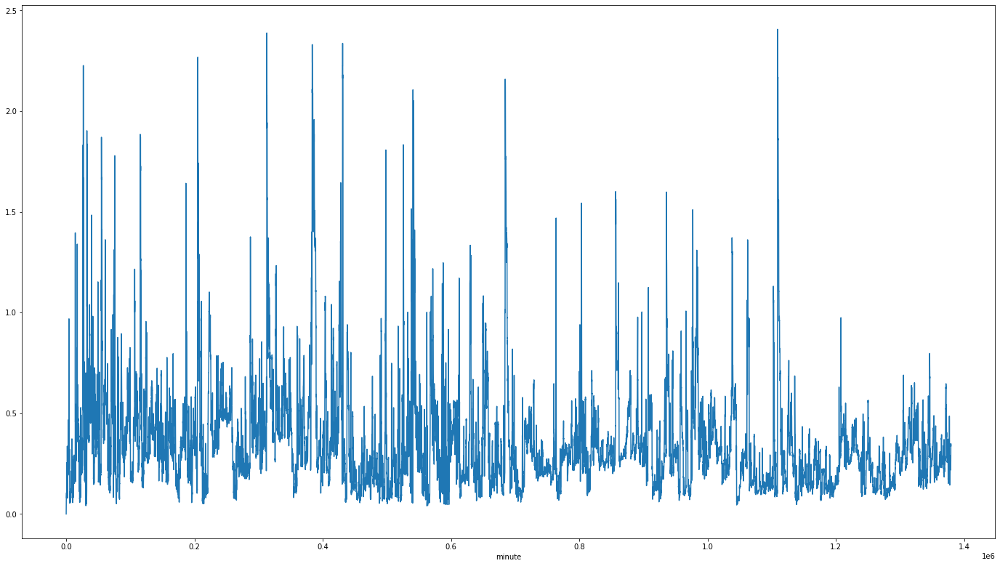

In [25]:
# exposures
sdf[[c for c in sdf.columns if "WE" in c]].sum(axis=1).plot()